In [ ]:
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/MyDrive/Colab Notebooks/LAB_mod_B/Project/Regression
import sys
print(sys.executable)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/MyDrive/Colab Notebooks/LAB_mod_B/Project/Regression
/usr/bin/python3


# Part 0: Importing libraries

In [ ]:
!pip install optuna

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import seaborn as sns
import os
from itertools import product
from tqdm.notebook import tqdm
import optuna

from sklearn.decomposition import PCA
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch import optim
from torch.utils.data import TensorDataset, Dataset, DataLoader, random_split, Subset, ConcatDataset

In [ ]:
import copy

# Part 1: Data - parte uguale al notebook 4

zona: IT_SUD <br>
energia: wind

In [ ]:
# LUCA's IMPORTS
sel_zone = 'IT_SUD'
energies = ['solar','wind','hydro']
detrended_energies = ['detrended_solar','detrended_wind','detrended_hydro']
energy_colors = ['red','green','blue']
target_index = 1

df_features = pd.read_csv(f'1_output/{sel_zone}_meteo_forecast_data.csv')
df_labels = pd.read_csv(f'2_outputs/{sel_zone}_installation_detrended_actuals.csv')

# remove timezone information
df_labels['date_time'] = pd.to_datetime(df_labels['date_time'], utc= True).dt.tz_convert(None)
# sort by date
df_labels = df_labels.sort_values('date_time')
df_labels = df_labels.set_index('date_time')
# resample every 3h with no overlapping windows and keeping the first timestamp as index
start_time = df_labels.index[0]
groups = []
# Define which columns to sum and which to average
sum_columns = ['solar','wind','hydro','load','detrended_solar','detrended_wind','detrended_hydro']
mean_columns = ['ratio','solar_installed','wind_installed','hydro_installed']  # example

groups = []
start_time = df_labels.index[0]

while start_time + pd.Timedelta(hours=3) <= df_labels.index[-1] + pd.Timedelta(minutes=1):
    end_time = start_time + pd.Timedelta(hours=3)
    chunk = df_labels[start_time:end_time - pd.Timedelta(seconds=1)]

    if len(chunk) == 3 and all((chunk.index == [start_time + pd.Timedelta(hours=i) for i in range(3)])):
        summed = chunk[sum_columns].sum()
        averaged = chunk[mean_columns].mean()

        combined = pd.concat([summed, averaged])
        combined.name = start_time
        groups.append(combined)

    start_time += pd.Timedelta(hours=3)

# retrieve date time info
result_df = pd.DataFrame(groups).reset_index().rename(columns={'index': 'date_time'})

df_labels = result_df

# normalize time to range [0, 1]
min_time = df_labels['date_time'].min()
max_time = df_labels['date_time'].max()
df_labels['time'] = (df_labels['date_time'] - min_time) / (max_time - min_time)
df_labels['time'] = df_labels['time'].astype(float)  # convert timedelta to float

# keep only desired columns
df_labels = df_labels[['date_time', 'time', 'detrended_solar', 'detrended_wind', 'detrended_hydro']]

In [ ]:
# we use as temporal info the day of the year (1...365)
features = ['day_sin_t-0','day_cos_t-0',
           'day_sin_t-1','day_cos_t-1',
           'day_sin_t-2','day_cos_t-2',
           'day_sin_t-3','day_cos_t-3',
           'day_sin_t-4','day_cos_t-4',
           'day_sin_t-5','day_cos_t-5',
           'day_sin_t-6','day_cos_t-6',
           'day_sin_t-7','day_cos_t-7',
           'day_sin_t-8','day_cos_t-8',
           'month_sin_t-0','month_cos_t-0',
           'month_sin_t-1','month_cos_t-1',
           'month_sin_t-2','month_cos_t-2',
           'month_sin_t-3','month_cos_t-3',
           'month_sin_t-4','month_cos_t-4',
           'month_sin_t-5','month_cos_t-5',
           'month_sin_t-6','month_cos_t-6',
           'month_sin_t-7','month_cos_t-7',
           'month_sin_t-8','month_cos_t-8']

# in alternative one can use the following lines to keep day and month time info
'''
features = ['sin_dayofyear_t0','cos_dayofyear_t0',
            'sin_dayofyear_t1','cos_dayofyear_t1',
            'sin_dayofyear_t2','cos_dayofyear_t2',
            'sin_dayofyear_t3','cos_dayofyear_t3',
            'sin_dayofyear_t4','cos_dayofyear_t4',
            'sin_dayofyear_t5','cos_dayofyear_t5',
            'sin_dayofyear_t6','cos_dayofyear_t6',
            'sin_dayofyear_t7','cos_dayofyear_t7',
            'sin_dayofyear_t8','cos_dayofyear_t8','Unnamed: 0'] '''

df_features = df_features.drop(columns = features)

In [ ]:
sel_cols = df_features.columns[(1+14*8):]
df_features = df_features[sel_cols]
df_features.head()
# methereological data every 3 hours, running over the course of a day  (10 features every 3 hour = 90 features)

,year_t-8,2t_t-8,solar_t-8,tp_t-8,ws_10m_t-8,ws_100m_t-8,hour_sin_t-8,hour_cos_t-8,sin_dayofyear_t-8,cos_dayofyear_t-8,...,2t_t-0,solar_t-0,tp_t-0,ws_10m_t-0,ws_100m_t-0,hour_sin_t-0,hour_cos_t-0,sin_dayofyear_t-0,cos_dayofyear_t-0,timestamp
0,-1.226396,-0.896389,-0.819128,-0.442515,0.015462,0.176925,-0.655455,1.534071,0.020723,1.320431,...,-1.060893,-0.819116,-0.425747,-1.046836,-0.902707,-1.040480,0.325597,0.045658,1.319813,2022-01-02 18:00:00
1,-1.226396,-0.970495,-0.819128,-0.442515,-0.061592,0.184076,0.274633,2.034760,0.045612,1.319815,...,-1.189771,-0.819116,-0.425747,-0.853498,-0.779843,-0.655249,1.534673,0.045658,1.319813,2022-01-02 21:00:00
2,-1.226396,-0.987718,-0.819128,-0.442515,-0.281432,-0.328692,1.204721,1.534071,0.045612,1.319815,...,-1.308490,-0.819116,-0.425747,-0.639297,-0.509097,0.274780,2.035489,0.070532,1.318785,2022-01-03 00:00:00
3,-1.226396,-1.140866,-0.512928,-0.442461,-0.475760,-0.381596,1.589976,0.325301,0.045612,1.319815,...,-1.388931,-0.819116,-0.425747,-0.568948,-0.272772,1.204810,1.534673,0.070532,1.318785,2022-01-03 03:00:00
4,-1.226396,-0.661419,0.680660,-0.442461,-0.660673,-0.793814,1.204721,-0.883469,0.045612,1.319815,...,-1.408846,-0.566558,-0.429222,-0.696879,-0.386094,1.590040,0.325597,0.070532,1.318785,2022-01-03 06:00:00


In [ ]:
df_labels.head()

,date_time,time,detrended_solar,detrended_wind,detrended_hydro
0,2022-01-01 00:00:00,0.000000,0.000000,0.601572,0.396476
1,2022-01-01 03:00:00,0.000114,0.000000,0.587530,0.396476
2,2022-01-01 06:00:00,0.000228,0.339468,0.404311,0.396476
3,2022-01-01 09:00:00,0.000343,1.219411,0.494581,0.405286
4,2022-01-01 12:00:00,0.000457,0.871697,0.837936,0.427313


In [ ]:
# keeping only the ones in common
df_labels['date_time'] = pd.to_datetime(df_labels['date_time']).dt.tz_localize(None)
df_features['date_time'] = pd.to_datetime(df_features['timestamp']).dt.tz_localize(None)
common = pd.merge(df_features, df_labels, on='date_time', how = 'inner')
df_labels = common[df_labels.columns]
df_features = common[df_features.columns]
print(np.shape(df_features),np.shape(df_labels))

(7952, 92) (7952, 5)


/tmp/ipython-input-9-2215504971.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_labels['date_time'] = pd.to_datetime(df_labels['date_time']).dt.tz_localize(None)


## Data Splitting (Train 70 - Val 15 - Test 15)

In [ ]:
X_array = df_features.drop(columns=['timestamp','date_time']).values
Y_array = df_labels[detrended_energies[target_index]].values
print(f'Attempting the regression on {detrended_energies[target_index]}')

total_size = len(X_array)
train_size = int(total_size * 0.7)
val_size = int(total_size * 0.15)
test_size = total_size - train_size - val_size

indices = list(range(total_size))

idx_train = indices[:train_size]
idx_val = indices[train_size:(train_size + val_size)]
idx_test = indices[(train_size + val_size):]

test_timestamps = df_features.loc[idx_test, 'timestamp'].reset_index(drop=True)

X_train = X_array[:train_size]
X_val = X_array[train_size:(train_size + val_size)]
X_test = X_array[(train_size + val_size):]

print("Train size:", X_train.shape)
print("Validation size:", X_val.shape)
print("Test size:", X_test.shape)

Y_train = Y_array[:train_size]
Y_val = Y_array[train_size:(train_size + val_size)]
Y_test = Y_array[(train_size + val_size):]


X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
Y_train_tensor = torch.tensor(Y_train, dtype=torch.float32)
X_val_tensor = torch.tensor(X_val, dtype=torch.float32)
Y_val_tensor = torch.tensor(Y_val, dtype=torch.float32)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
Y_test_tensor = torch.tensor(Y_test, dtype=torch.float32)

from torch.utils.data import TensorDataset, DataLoader

train_dataset = TensorDataset(X_train_tensor, Y_train_tensor)
val_dataset = TensorDataset(X_val_tensor, Y_val_tensor)
test_dataset = TensorDataset(X_test_tensor, Y_test_tensor)

# Reshape the Y tensors (model consistency if we want multiple features)
Y_train_tensor = Y_train_tensor.view(-1, 1)
Y_val_tensor = Y_val_tensor.view(-1, 1)
Y_test_tensor = Y_test_tensor.view(-1, 1)

Attempting the regression on detrended_wind
Train size: (5566, 90)
Validation size: (1192, 90)
Test size: (1194, 90)


In [ ]:
#### make directory for saving screenshots
base_dir = "4_plots"
zone_dir = os.path.join(base_dir, sel_zone)

try:
    os.makedirs(zone_dir, exist_ok=True)
    print(f"Directory '{zone_dir}' is ready.")
except PermissionError:
    print(f"Permission denied: Unable to create '{zone_dir}'.")
except Exception as e:
    print(f"An error occurred: {e}")


#### make directory for saving screenshots
base_dir = "4_plots"
zone_dir = os.path.join(base_dir, sel_zone, energies[target_index])

try:
    os.makedirs(zone_dir, exist_ok=True)
    print(f"Directory '{zone_dir}' is ready.")
except PermissionError:
    print(f"Permission denied: Unable to create '{zone_dir}'.")
except Exception as e:
    print(f"An error occurred: {e}")

# make directory for saving weights
base_dir = "4_weights"
zone_dir = os.path.join(base_dir, sel_zone, energies[target_index])

try:
    os.makedirs(zone_dir, exist_ok=True)
    print(f"Directory '{zone_dir}' is ready.")
except PermissionError:
    print(f"Permission denied: Unable to create '{zone_dir}/{energies[target_index]}'.")
except Exception as e:
    print(f"An error occurred: {e}")

# make directory for saving studies
base_dir = "4_optuna"
zone_dir = os.path.join(base_dir, sel_zone, energies[target_index])

try:
    os.makedirs(zone_dir, exist_ok=True)
    print(f"Directory '{zone_dir}' is ready.")
except PermissionError:
    print(f"Permission denied: Unable to create '{zone_dir}/{energies[target_index]}'.")
except Exception as e:
    print(f"An error occurred: {e}")

# make directory for saving BEST MODELS
base_dir = "4_best_models"
zone_dir = os.path.join(base_dir, sel_zone, energies[target_index])

try:
    os.makedirs(zone_dir, exist_ok=True)
    print(f"Directory '{zone_dir}' is ready.")
except PermissionError:
    print(f"Permission denied: Unable to create '{zone_dir}/{energies[target_index]}'.")
except Exception as e:
    print(f"An error occurred: {e}")

Directory '4_plots/IT_SUD' is ready.
Directory '4_plots/IT_SUD/wind' is ready.
Directory '4_weights/IT_SUD/wind' is ready.
Directory '4_optuna/IT_SUD/wind' is ready.
Directory '4_best_models/IT_SUD/wind' is ready.


# Part 2: Regression

## 2.1 Model Definition

In [ ]:
class SimpleRegressor(nn.Module):
  def __init__(self, input_dim, hidden_dims, output_dim, activation_fn, dropout_prob = 0.1):
    super(SimpleRegressor, self).__init__()

    #first hidden layer
    self.fc1 = nn.Linear(input_dim, hidden_dims[0])
    self.batch1 = nn.BatchNorm1d(hidden_dims[0])
    self.drop1 = nn.Dropout(p = dropout_prob)

    #second hidden layer
    self.fc2 = nn.Linear(hidden_dims[0], hidden_dims[1])
    self.batch2 = nn.BatchNorm1d(hidden_dims[1])
    self.drop2 = nn.Dropout(p = dropout_prob)

    #output layer
    self.out = nn.Linear(hidden_dims[1], output_dim)
    self.activation = activation_fn

  def forward(self, x):
    x_lin = self.fc1(x)
    x_bat = self.batch1(x_lin)
    x_act = self.activation(x_bat)
    h1 = self.drop1(x_act)

    x_lin = self.fc2(h1)
    x_bat = self.batch2(x_lin)
    x_act = self.activation(x_bat)
    h2 = self.drop2(x_act)

    out = self.out(h2)
    return out

  def regr_loss(self, y, output, lambda_tik):
    mse = F.mse_loss(output, y, reduction='mean')

    w_norm = 0.0
    for param in self.parameters():
        w_norm += torch.sum((param)**2)

    return mse + lambda_tik * w_norm

## 2.3 Training

In [ ]:
def training(model, train_loader, val_loader, optimizer, device, num_epochs, lambda_tik, trial=None):
  history = {
      'train_loss': [],
      'val_loss': [],
      'actual_epochs': 0
  }

  # early stopping
  patience = 10
  best_val_loss = float('inf')
  epochs_no_improve = 0
  best_model_state = None

  for epoch in range(num_epochs):
    loop = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}", leave=True)

    model.train()
    running_train_loss = 0.0

    for x, y in loop:
      x, y = x.to(device), y.to(device)
      y = y.view(-1, 1)

      optimizer.zero_grad()
      preds = model(x)
      loss = model.regr_loss(y, preds, lambda_tik)
      loss.backward()
      optimizer.step()
      running_train_loss += loss.item()

    # Validation
    model.eval()
    val_loss = 0.0

    with torch.no_grad():
      for x, y in val_loader:
        x, y = x.to(device), y.to(device)
        y = y.view(-1, 1)

        preds = model(x)
        loss = model.regr_loss(y, preds, lambda_tik)
        val_loss += loss.item()

    avg_train_loss = running_train_loss / len(train_loader)
    avg_val_loss = val_loss / len(val_loader)

    print(f"[Epoch {epoch+1}/{num_epochs}] Train Loss: {avg_train_loss:.4f}, Val Loss: {avg_val_loss:.4f}")

    history['train_loss'].append(avg_train_loss)
    history['val_loss'].append(avg_val_loss)

    # for Optuna prune
    if trial is not None:
      trial.report(avg_val_loss, step=epoch)

      if trial.should_prune():
        print(f"Pruned at epoch {epoch+1}")
        raise optuna.exceptions.TrialPruned()

    if avg_val_loss < best_val_loss:
      best_val_loss = avg_val_loss
      epochs_no_improve = 0
      best_model_state = copy.deepcopy(model.state_dict())
    else:
      epochs_no_improve += 1
      if epochs_no_improve >= patience:
        print(f"Early stopping at epoch {epoch+1}")
        break

  if best_model_state is not None:
    model.load_state_dict(best_model_state)

  history['actual_epochs'] = epoch + 1

  return history

In [ ]:
def objective(trial):
  device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

  # Sample hyperparams
  hidden_dims = trial.suggest_categorical("hidden_dims", [(32, 16), (16, 8), (8, 4)])
  dropout = trial.suggest_float("dropout", 0.3, 0.8, step=0.1)
  lambda_tik = trial.suggest_float("lambda_tik", 1e-4, 1e2, log=True)
  lr = trial.suggest_categorical("lr", [1e-5, 1e-4, 1e-3])
  batch_size = trial.suggest_categorical("batch_size", [8, 16, 32])
  #weight_decay = trial.suggest_float("weight_decay", 1e-6, 1e-2, log=True)

  train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, drop_last=True)
  val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

  # Model
  model = SimpleRegressor(
      input_dim=X_array.shape[1],
      hidden_dims=hidden_dims,
      output_dim=1,
      activation_fn=nn.ReLU(),
      dropout_prob=dropout
  ).to(device)

  optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=0)

  # Train with early stopping
  history = training(model, train_loader, val_loader, optimizer, device, num_epochs=50, lambda_tik=lambda_tik, trial=trial)

  return min(history['val_loss'])

In [ ]:
study = optuna.create_study(direction="minimize", pruner=optuna.pruners.MedianPruner(n_warmup_steps=10))
study.optimize(objective, n_trials=50)

[I 2025-07-04 17:39:18,117] A new study created in memory with name: no-name-f4d60c19-3d0c-45de-a52c-47ed7cdcf606
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (32, 16) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (16, 8) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (8, 4) which is of type tuple.
  warnings.warn(message)


Epoch 1/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 1/50] Train Loss: 87.4641, Val Loss: 86.8020


Epoch 2/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 2/50] Train Loss: 86.4509, Val Loss: 85.8061


Epoch 3/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 3/50] Train Loss: 85.4698, Val Loss: 84.8399


Epoch 4/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 4/50] Train Loss: 84.5202, Val Loss: 83.9041


Epoch 5/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 5/50] Train Loss: 83.5963, Val Loss: 82.9967


Epoch 6/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 6/50] Train Loss: 82.7010, Val Loss: 82.1141


Epoch 7/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 7/50] Train Loss: 81.8294, Val Loss: 81.2557


Epoch 8/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 8/50] Train Loss: 80.9821, Val Loss: 80.4193


Epoch 9/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 9/50] Train Loss: 80.1577, Val Loss: 79.6026


Epoch 10/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 10/50] Train Loss: 79.3506, Val Loss: 78.8114


Epoch 11/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 11/50] Train Loss: 78.5704, Val Loss: 78.0384


Epoch 12/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 12/50] Train Loss: 77.8077, Val Loss: 77.2851


Epoch 13/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 13/50] Train Loss: 77.0616, Val Loss: 76.5484


Epoch 14/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 14/50] Train Loss: 76.3368, Val Loss: 75.8327


Epoch 15/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 15/50] Train Loss: 75.6280, Val Loss: 75.1321


Epoch 16/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 16/50] Train Loss: 74.9366, Val Loss: 74.4499


Epoch 17/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 17/50] Train Loss: 74.2629, Val Loss: 73.7842


Epoch 18/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 18/50] Train Loss: 73.6045, Val Loss: 73.1313


Epoch 19/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 19/50] Train Loss: 72.9581, Val Loss: 72.4950


Epoch 20/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 20/50] Train Loss: 72.3296, Val Loss: 71.8733


Epoch 21/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 21/50] Train Loss: 71.7155, Val Loss: 71.2648


Epoch 22/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 22/50] Train Loss: 71.1148, Val Loss: 70.6720


Epoch 23/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 23/50] Train Loss: 70.5259, Val Loss: 70.0903


Epoch 24/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 24/50] Train Loss: 69.9540, Val Loss: 69.5211


Epoch 25/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 25/50] Train Loss: 69.3924, Val Loss: 68.9661


Epoch 26/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 26/50] Train Loss: 68.8420, Val Loss: 68.4221


Epoch 27/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 27/50] Train Loss: 68.3044, Val Loss: 67.8915


Epoch 28/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 28/50] Train Loss: 67.7771, Val Loss: 67.3715


Epoch 29/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 29/50] Train Loss: 67.2632, Val Loss: 66.8632


Epoch 30/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 30/50] Train Loss: 66.7624, Val Loss: 66.3665


Epoch 31/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 31/50] Train Loss: 66.2702, Val Loss: 65.8790


Epoch 32/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 32/50] Train Loss: 65.7884, Val Loss: 65.4039


Epoch 33/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 33/50] Train Loss: 65.3171, Val Loss: 64.9373


Epoch 34/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 34/50] Train Loss: 64.8567, Val Loss: 64.4807


Epoch 35/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 35/50] Train Loss: 64.4048, Val Loss: 64.0345


Epoch 36/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 36/50] Train Loss: 63.9653, Val Loss: 63.5973


Epoch 37/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 37/50] Train Loss: 63.5297, Val Loss: 63.1700


Epoch 38/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 38/50] Train Loss: 63.1069, Val Loss: 62.7512


Epoch 39/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 39/50] Train Loss: 62.6934, Val Loss: 62.3417


Epoch 40/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 40/50] Train Loss: 62.2870, Val Loss: 61.9396


Epoch 41/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 41/50] Train Loss: 61.8856, Val Loss: 61.5466


Epoch 42/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 42/50] Train Loss: 61.4972, Val Loss: 61.1617


Epoch 43/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 43/50] Train Loss: 61.1131, Val Loss: 60.7839


Epoch 44/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 44/50] Train Loss: 60.7384, Val Loss: 60.4133


Epoch 45/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 45/50] Train Loss: 60.3713, Val Loss: 60.0488


Epoch 46/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 46/50] Train Loss: 60.0105, Val Loss: 59.6938


Epoch 47/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 47/50] Train Loss: 59.6554, Val Loss: 59.3437


Epoch 48/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 48/50] Train Loss: 59.3078, Val Loss: 58.9994


Epoch 49/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 49/50] Train Loss: 58.9650, Val Loss: 58.6613


Epoch 50/50:   0%|          | 0/173 [00:00<?, ?it/s]

[I 2025-07-04 17:40:02,152] Trial 0 finished with value: 58.330584275095084 and parameters: {'hidden_dims': (8, 4), 'dropout': 0.3, 'lambda_tik': 5.183008476736053, 'lr': 1e-05, 'batch_size': 32}. Best is trial 0 with value: 58.330584275095084.


[Epoch 50/50] Train Loss: 58.6276, Val Loss: 58.3306


/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (32, 16) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (16, 8) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (8, 4) which is of type tuple.
  warnings.warn(message)


Epoch 1/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 1/50] Train Loss: 78.0976, Val Loss: 26.8459


Epoch 2/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 2/50] Train Loss: 10.9669, Val Loss: 2.5671


Epoch 3/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 3/50] Train Loss: 1.3309, Val Loss: 0.6655


Epoch 4/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 4/50] Train Loss: 0.8068, Val Loss: 0.6306


Epoch 5/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 5/50] Train Loss: 0.8004, Val Loss: 0.6308


Epoch 6/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 6/50] Train Loss: 0.8001, Val Loss: 0.6314


Epoch 7/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 7/50] Train Loss: 0.8002, Val Loss: 0.6309


Epoch 8/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 8/50] Train Loss: 0.8002, Val Loss: 0.6312


Epoch 9/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 9/50] Train Loss: 0.7993, Val Loss: 0.6305


Epoch 10/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 10/50] Train Loss: 0.8007, Val Loss: 0.6306


Epoch 11/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 11/50] Train Loss: 0.7998, Val Loss: 0.6309


Epoch 12/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 12/50] Train Loss: 0.7996, Val Loss: 0.6307


Epoch 13/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 13/50] Train Loss: 0.8002, Val Loss: 0.6308


Epoch 14/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 14/50] Train Loss: 0.8001, Val Loss: 0.6307


Epoch 15/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 15/50] Train Loss: 0.8008, Val Loss: 0.6314


Epoch 16/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 16/50] Train Loss: 0.8006, Val Loss: 0.6305


Epoch 17/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 17/50] Train Loss: 0.7982, Val Loss: 0.6306


Epoch 18/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 18/50] Train Loss: 0.7995, Val Loss: 0.6306


Epoch 19/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 19/50] Train Loss: 0.7999, Val Loss: 0.6307


Epoch 20/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 20/50] Train Loss: 0.7998, Val Loss: 0.6310


Epoch 21/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 21/50] Train Loss: 0.8009, Val Loss: 0.6311


Epoch 22/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 22/50] Train Loss: 0.8001, Val Loss: 0.6315


Epoch 23/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 23/50] Train Loss: 0.8008, Val Loss: 0.6305


Epoch 24/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 24/50] Train Loss: 0.8003, Val Loss: 0.6312


Epoch 25/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 25/50] Train Loss: 0.8008, Val Loss: 0.6313


Epoch 26/50:   0%|          | 0/695 [00:00<?, ?it/s]

[I 2025-07-04 17:41:27,884] Trial 1 finished with value: 0.6304972919341701 and parameters: {'hidden_dims': (8, 4), 'dropout': 0.6000000000000001, 'lambda_tik': 12.032868483328611, 'lr': 0.001, 'batch_size': 8}. Best is trial 1 with value: 0.6304972919341701.


[Epoch 26/50] Train Loss: 0.8001, Val Loss: 0.6305
Early stopping at epoch 26


/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (32, 16) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (16, 8) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (8, 4) which is of type tuple.
  warnings.warn(message)


Epoch 1/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 1/50] Train Loss: 1.3765, Val Loss: 0.5920


Epoch 2/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 2/50] Train Loss: 1.3133, Val Loss: 0.5898


Epoch 3/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 3/50] Train Loss: 1.2855, Val Loss: 0.5729


Epoch 4/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 4/50] Train Loss: 1.2794, Val Loss: 0.5579


Epoch 5/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 5/50] Train Loss: 1.2600, Val Loss: 0.5516


Epoch 6/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 6/50] Train Loss: 1.2315, Val Loss: 0.5599


Epoch 7/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 7/50] Train Loss: 1.2020, Val Loss: 0.5622


Epoch 8/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 8/50] Train Loss: 1.1787, Val Loss: 0.5400


Epoch 9/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 9/50] Train Loss: 1.1619, Val Loss: 0.5456


Epoch 10/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 10/50] Train Loss: 1.1300, Val Loss: 0.5451


Epoch 11/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 11/50] Train Loss: 1.1177, Val Loss: 0.5461


Epoch 12/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 12/50] Train Loss: 1.1171, Val Loss: 0.5226


Epoch 13/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 13/50] Train Loss: 1.0686, Val Loss: 0.5138


Epoch 14/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 14/50] Train Loss: 1.0675, Val Loss: 0.5061


Epoch 15/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 15/50] Train Loss: 1.0602, Val Loss: 0.5160


Epoch 16/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 16/50] Train Loss: 1.0173, Val Loss: 0.5145


Epoch 17/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 17/50] Train Loss: 0.9996, Val Loss: 0.4863


Epoch 18/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 18/50] Train Loss: 0.9882, Val Loss: 0.5098


Epoch 19/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 19/50] Train Loss: 0.9670, Val Loss: 0.5172


Epoch 20/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 20/50] Train Loss: 0.9328, Val Loss: 0.5054


Epoch 21/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 21/50] Train Loss: 0.9431, Val Loss: 0.4859


Epoch 22/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 22/50] Train Loss: 0.9128, Val Loss: 0.4907


Epoch 23/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 23/50] Train Loss: 0.8968, Val Loss: 0.4839


Epoch 24/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 24/50] Train Loss: 0.8849, Val Loss: 0.4655


Epoch 25/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 25/50] Train Loss: 0.8740, Val Loss: 0.4592


Epoch 26/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 26/50] Train Loss: 0.8620, Val Loss: 0.4668


Epoch 27/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 27/50] Train Loss: 0.8540, Val Loss: 0.4602


Epoch 28/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 28/50] Train Loss: 0.8373, Val Loss: 0.4566


Epoch 29/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 29/50] Train Loss: 0.8247, Val Loss: 0.4589


Epoch 30/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 30/50] Train Loss: 0.8165, Val Loss: 0.4490


Epoch 31/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 31/50] Train Loss: 0.7990, Val Loss: 0.4406


Epoch 32/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 32/50] Train Loss: 0.7844, Val Loss: 0.4437


Epoch 33/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 33/50] Train Loss: 0.7663, Val Loss: 0.4364


Epoch 34/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 34/50] Train Loss: 0.7646, Val Loss: 0.4373


Epoch 35/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 35/50] Train Loss: 0.7416, Val Loss: 0.4336


Epoch 36/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 36/50] Train Loss: 0.7595, Val Loss: 0.4151


Epoch 37/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 37/50] Train Loss: 0.7364, Val Loss: 0.4268


Epoch 38/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 38/50] Train Loss: 0.7212, Val Loss: 0.4247


Epoch 39/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 39/50] Train Loss: 0.7153, Val Loss: 0.4165


Epoch 40/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 40/50] Train Loss: 0.6926, Val Loss: 0.4264


Epoch 41/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 41/50] Train Loss: 0.6856, Val Loss: 0.4016


Epoch 42/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 42/50] Train Loss: 0.6752, Val Loss: 0.4060


Epoch 43/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 43/50] Train Loss: 0.6839, Val Loss: 0.3927


Epoch 44/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 44/50] Train Loss: 0.6616, Val Loss: 0.4016


Epoch 45/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 45/50] Train Loss: 0.6687, Val Loss: 0.3784


Epoch 46/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 46/50] Train Loss: 0.6545, Val Loss: 0.3811


Epoch 47/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 47/50] Train Loss: 0.6385, Val Loss: 0.3846


Epoch 48/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 48/50] Train Loss: 0.6295, Val Loss: 0.3946


Epoch 49/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 49/50] Train Loss: 0.6336, Val Loss: 0.3924


Epoch 50/50:   0%|          | 0/173 [00:00<?, ?it/s]

[I 2025-07-04 17:42:12,245] Trial 2 finished with value: 0.37842611203852455 and parameters: {'hidden_dims': (32, 16), 'dropout': 0.7, 'lambda_tik': 0.0007763618052730904, 'lr': 1e-05, 'batch_size': 32}. Best is trial 2 with value: 0.37842611203852455.


[Epoch 50/50] Train Loss: 0.6039, Val Loss: 0.3803


/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (32, 16) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (16, 8) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (8, 4) which is of type tuple.
  warnings.warn(message)


Epoch 1/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 1/50] Train Loss: 2.2874, Val Loss: 1.5132


Epoch 2/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 2/50] Train Loss: 1.3660, Val Loss: 0.9485


Epoch 3/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 3/50] Train Loss: 0.9162, Val Loss: 0.6657


Epoch 4/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 4/50] Train Loss: 0.6867, Val Loss: 0.5117


Epoch 5/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 5/50] Train Loss: 0.5443, Val Loss: 0.4051


Epoch 6/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 6/50] Train Loss: 0.4631, Val Loss: 0.3535


Epoch 7/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 7/50] Train Loss: 0.4110, Val Loss: 0.3177


Epoch 8/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 8/50] Train Loss: 0.3795, Val Loss: 0.2876


Epoch 9/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 9/50] Train Loss: 0.3614, Val Loss: 0.2822


Epoch 10/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 10/50] Train Loss: 0.3546, Val Loss: 0.2603


Epoch 11/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 11/50] Train Loss: 0.3511, Val Loss: 0.2777


Epoch 12/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 12/50] Train Loss: 0.3545, Val Loss: 0.2678


Epoch 13/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 13/50] Train Loss: 0.3555, Val Loss: 0.2668


Epoch 14/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 14/50] Train Loss: 0.3517, Val Loss: 0.2725


Epoch 15/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 15/50] Train Loss: 0.3537, Val Loss: 0.2720


Epoch 16/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 16/50] Train Loss: 0.3492, Val Loss: 0.2639


Epoch 17/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 17/50] Train Loss: 0.3536, Val Loss: 0.2718


Epoch 18/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 18/50] Train Loss: 0.3554, Val Loss: 0.2777


Epoch 19/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 19/50] Train Loss: 0.3466, Val Loss: 0.2585


Epoch 20/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 20/50] Train Loss: 0.3553, Val Loss: 0.2665


Epoch 21/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 21/50] Train Loss: 0.3471, Val Loss: 0.2639


Epoch 22/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 22/50] Train Loss: 0.3536, Val Loss: 0.2626


Epoch 23/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 23/50] Train Loss: 0.3527, Val Loss: 0.2543


Epoch 24/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 24/50] Train Loss: 0.3534, Val Loss: 0.2615


Epoch 25/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 25/50] Train Loss: 0.3543, Val Loss: 0.2708


Epoch 26/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 26/50] Train Loss: 0.3508, Val Loss: 0.2748


Epoch 27/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 27/50] Train Loss: 0.3527, Val Loss: 0.2650


Epoch 28/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 28/50] Train Loss: 0.3568, Val Loss: 0.2662


Epoch 29/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 29/50] Train Loss: 0.3549, Val Loss: 0.2710


Epoch 30/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 30/50] Train Loss: 0.3494, Val Loss: 0.2659


Epoch 31/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 31/50] Train Loss: 0.3505, Val Loss: 0.2669


Epoch 32/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 32/50] Train Loss: 0.3506, Val Loss: 0.2710


Epoch 33/50:   0%|          | 0/173 [00:00<?, ?it/s]

[I 2025-07-04 17:42:41,785] Trial 3 finished with value: 0.25433287612701716 and parameters: {'hidden_dims': (8, 4), 'dropout': 0.4, 'lambda_tik': 0.10346474799766159, 'lr': 0.001, 'batch_size': 32}. Best is trial 3 with value: 0.25433287612701716.


[Epoch 33/50] Train Loss: 0.3523, Val Loss: 0.2603
Early stopping at epoch 33


/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (32, 16) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (16, 8) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (8, 4) which is of type tuple.
  warnings.warn(message)


Epoch 1/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 1/50] Train Loss: 1.7839, Val Loss: 1.1974


Epoch 2/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 2/50] Train Loss: 1.6995, Val Loss: 1.2162


Epoch 3/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 3/50] Train Loss: 1.6015, Val Loss: 1.1647


Epoch 4/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 4/50] Train Loss: 1.5556, Val Loss: 1.1903


Epoch 5/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 5/50] Train Loss: 1.5137, Val Loss: 1.1563


Epoch 6/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 6/50] Train Loss: 1.4214, Val Loss: 1.0409


Epoch 7/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 7/50] Train Loss: 1.3696, Val Loss: 0.9611


Epoch 8/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 8/50] Train Loss: 1.3172, Val Loss: 0.9161


Epoch 9/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 9/50] Train Loss: 1.2872, Val Loss: 0.9515


Epoch 10/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 10/50] Train Loss: 1.2216, Val Loss: 0.7816


Epoch 11/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 11/50] Train Loss: 1.1615, Val Loss: 0.8870


Epoch 12/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 12/50] Train Loss: 1.0893, Val Loss: 0.7699


Epoch 13/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 13/50] Train Loss: 1.0705, Val Loss: 0.7888


Epoch 14/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 14/50] Train Loss: 1.0533, Val Loss: 0.7715


Epoch 15/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 15/50] Train Loss: 0.9799, Val Loss: 0.7428


Epoch 16/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 16/50] Train Loss: 0.9353, Val Loss: 0.6447


Epoch 17/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 17/50] Train Loss: 0.9098, Val Loss: 0.6207


Epoch 18/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 18/50] Train Loss: 0.8766, Val Loss: 0.6403


Epoch 19/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 19/50] Train Loss: 0.8512, Val Loss: 0.5728


Epoch 20/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 20/50] Train Loss: 0.7948, Val Loss: 0.5896


Epoch 21/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 21/50] Train Loss: 0.7974, Val Loss: 0.5915


Epoch 22/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 22/50] Train Loss: 0.7713, Val Loss: 0.5442


Epoch 23/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 23/50] Train Loss: 0.7146, Val Loss: 0.5128


Epoch 24/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 24/50] Train Loss: 0.7039, Val Loss: 0.5466


Epoch 25/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 25/50] Train Loss: 0.7005, Val Loss: 0.4657


Epoch 26/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 26/50] Train Loss: 0.6648, Val Loss: 0.4878


Epoch 27/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 27/50] Train Loss: 0.6403, Val Loss: 0.4679


Epoch 28/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 28/50] Train Loss: 0.6283, Val Loss: 0.4476


Epoch 29/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 29/50] Train Loss: 0.5973, Val Loss: 0.4264


Epoch 30/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 30/50] Train Loss: 0.6025, Val Loss: 0.4403


Epoch 31/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 31/50] Train Loss: 0.5791, Val Loss: 0.4210


Epoch 32/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 32/50] Train Loss: 0.5674, Val Loss: 0.3997


Epoch 33/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 33/50] Train Loss: 0.5626, Val Loss: 0.4054


Epoch 34/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 34/50] Train Loss: 0.5365, Val Loss: 0.3998


Epoch 35/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 35/50] Train Loss: 0.5283, Val Loss: 0.3858


Epoch 36/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 36/50] Train Loss: 0.5140, Val Loss: 0.3463


Epoch 37/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 37/50] Train Loss: 0.5132, Val Loss: 0.3614


Epoch 38/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 38/50] Train Loss: 0.4951, Val Loss: 0.3543


Epoch 39/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 39/50] Train Loss: 0.4876, Val Loss: 0.3348


Epoch 40/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 40/50] Train Loss: 0.4686, Val Loss: 0.3032


Epoch 41/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 41/50] Train Loss: 0.4646, Val Loss: 0.3189


Epoch 42/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 42/50] Train Loss: 0.4553, Val Loss: 0.2980


Epoch 43/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 43/50] Train Loss: 0.4659, Val Loss: 0.3254


Epoch 44/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 44/50] Train Loss: 0.4411, Val Loss: 0.2822


Epoch 45/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 45/50] Train Loss: 0.4538, Val Loss: 0.2763


Epoch 46/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 46/50] Train Loss: 0.4408, Val Loss: 0.2728


Epoch 47/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 47/50] Train Loss: 0.4255, Val Loss: 0.3021


Epoch 48/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 48/50] Train Loss: 0.4108, Val Loss: 0.2677


Epoch 49/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 49/50] Train Loss: 0.4137, Val Loss: 0.2694


Epoch 50/50:   0%|          | 0/695 [00:00<?, ?it/s]

[I 2025-07-04 17:45:28,884] Trial 4 finished with value: 0.2533481913374974 and parameters: {'hidden_dims': (16, 8), 'dropout': 0.6000000000000001, 'lambda_tik': 0.0008827255169678528, 'lr': 1e-05, 'batch_size': 8}. Best is trial 4 with value: 0.2533481913374974.


[Epoch 50/50] Train Loss: 0.4116, Val Loss: 0.2533


/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (32, 16) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (16, 8) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (8, 4) which is of type tuple.
  warnings.warn(message)


Epoch 1/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 1/50] Train Loss: 1.7984, Val Loss: 1.0401


Epoch 2/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 2/50] Train Loss: 1.6216, Val Loss: 1.0853


Epoch 3/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 3/50] Train Loss: 1.4885, Val Loss: 1.0965


Epoch 4/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 4/50] Train Loss: 1.3981, Val Loss: 0.8511


Epoch 5/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 5/50] Train Loss: 1.3064, Val Loss: 0.8980


Epoch 6/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 6/50] Train Loss: 1.2253, Val Loss: 0.8700


Epoch 7/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 7/50] Train Loss: 1.1591, Val Loss: 0.7853


Epoch 8/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 8/50] Train Loss: 1.1011, Val Loss: 0.7215


Epoch 9/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 9/50] Train Loss: 1.0550, Val Loss: 0.7817


Epoch 10/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 10/50] Train Loss: 0.9758, Val Loss: 0.6110


Epoch 11/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 11/50] Train Loss: 0.9239, Val Loss: 0.6709


Epoch 12/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 12/50] Train Loss: 0.9031, Val Loss: 0.6402


Epoch 13/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 13/50] Train Loss: 0.8647, Val Loss: 0.5909


Epoch 14/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 14/50] Train Loss: 0.8157, Val Loss: 0.6298


Epoch 15/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 15/50] Train Loss: 0.7899, Val Loss: 0.5531


Epoch 16/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 16/50] Train Loss: 0.7744, Val Loss: 0.5612


Epoch 17/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 17/50] Train Loss: 0.7404, Val Loss: 0.5813


Epoch 18/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 18/50] Train Loss: 0.7208, Val Loss: 0.5122


Epoch 19/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 19/50] Train Loss: 0.7001, Val Loss: 0.4815


Epoch 20/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 20/50] Train Loss: 0.6873, Val Loss: 0.4760


Epoch 21/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 21/50] Train Loss: 0.6713, Val Loss: 0.4712


Epoch 22/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 22/50] Train Loss: 0.6493, Val Loss: 0.4874


Epoch 23/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 23/50] Train Loss: 0.6499, Val Loss: 0.4528


Epoch 24/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 24/50] Train Loss: 0.6388, Val Loss: 0.4221


Epoch 25/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 25/50] Train Loss: 0.6290, Val Loss: 0.4852


Epoch 26/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 26/50] Train Loss: 0.6217, Val Loss: 0.4107


Epoch 27/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 27/50] Train Loss: 0.5930, Val Loss: 0.4758


Epoch 28/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 28/50] Train Loss: 0.5885, Val Loss: 0.4246


Epoch 29/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 29/50] Train Loss: 0.5828, Val Loss: 0.4181


Epoch 30/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 30/50] Train Loss: 0.5839, Val Loss: 0.4091


Epoch 31/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 31/50] Train Loss: 0.5676, Val Loss: 0.4390


Epoch 32/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 32/50] Train Loss: 0.5626, Val Loss: 0.4072


Epoch 33/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 33/50] Train Loss: 0.5552, Val Loss: 0.4120


Epoch 34/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 34/50] Train Loss: 0.5504, Val Loss: 0.4079


Epoch 35/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 35/50] Train Loss: 0.5329, Val Loss: 0.3969


Epoch 36/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 36/50] Train Loss: 0.5369, Val Loss: 0.3917


Epoch 37/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 37/50] Train Loss: 0.5249, Val Loss: 0.4006


Epoch 38/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 38/50] Train Loss: 0.5345, Val Loss: 0.4147


Epoch 39/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 39/50] Train Loss: 0.5155, Val Loss: 0.3806


Epoch 40/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 40/50] Train Loss: 0.5162, Val Loss: 0.4265


Epoch 41/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 41/50] Train Loss: 0.5145, Val Loss: 0.3687


Epoch 42/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 42/50] Train Loss: 0.5097, Val Loss: 0.3924


Epoch 43/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 43/50] Train Loss: 0.5119, Val Loss: 0.3755


Epoch 44/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 44/50] Train Loss: 0.5023, Val Loss: 0.3658


Epoch 45/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 45/50] Train Loss: 0.4938, Val Loss: 0.3784


Epoch 46/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 46/50] Train Loss: 0.4804, Val Loss: 0.3464


Epoch 47/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 47/50] Train Loss: 0.4823, Val Loss: 0.3449


Epoch 48/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 48/50] Train Loss: 0.4829, Val Loss: 0.3675


Epoch 49/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 49/50] Train Loss: 0.4754, Val Loss: 0.3479


Epoch 50/50:   0%|          | 0/695 [00:00<?, ?it/s]

[I 2025-07-04 17:48:18,248] Trial 5 finished with value: 0.34494273194530667 and parameters: {'hidden_dims': (32, 16), 'dropout': 0.5, 'lambda_tik': 0.0034638775552428393, 'lr': 1e-05, 'batch_size': 8}. Best is trial 4 with value: 0.2533481913374974.


[Epoch 50/50] Train Loss: 0.4697, Val Loss: 0.3650


/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (32, 16) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (16, 8) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (8, 4) which is of type tuple.
  warnings.warn(message)


Epoch 1/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 1/50] Train Loss: 2.8656, Val Loss: 1.6858


Epoch 2/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 2/50] Train Loss: 2.1530, Val Loss: 1.3506


Epoch 3/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 3/50] Train Loss: 1.7029, Val Loss: 1.0663


Epoch 4/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 4/50] Train Loss: 1.3561, Val Loss: 0.8628


Epoch 5/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 5/50] Train Loss: 1.1213, Val Loss: 0.7338


Epoch 6/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 6/50] Train Loss: 0.9319, Val Loss: 0.6059


Epoch 7/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 7/50] Train Loss: 0.7791, Val Loss: 0.4807


Epoch 8/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 8/50] Train Loss: 0.6705, Val Loss: 0.3922


Epoch 9/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 9/50] Train Loss: 0.5895, Val Loss: 0.3182


Epoch 10/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 10/50] Train Loss: 0.5301, Val Loss: 0.3174


Epoch 11/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 11/50] Train Loss: 0.4859, Val Loss: 0.2738


Epoch 12/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 12/50] Train Loss: 0.4481, Val Loss: 0.2369


Epoch 13/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 13/50] Train Loss: 0.4267, Val Loss: 0.1900


Epoch 14/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 14/50] Train Loss: 0.3972, Val Loss: 0.2047


Epoch 15/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 15/50] Train Loss: 0.3681, Val Loss: 0.1850


Epoch 16/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 16/50] Train Loss: 0.3558, Val Loss: 0.1997


Epoch 17/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 17/50] Train Loss: 0.3515, Val Loss: 0.1769


Epoch 18/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 18/50] Train Loss: 0.3282, Val Loss: 0.2133


Epoch 19/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 19/50] Train Loss: 0.3046, Val Loss: 0.1839


Epoch 20/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 20/50] Train Loss: 0.2983, Val Loss: 0.1816


Epoch 21/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 21/50] Train Loss: 0.3083, Val Loss: 0.1868


Epoch 22/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 22/50] Train Loss: 0.2982, Val Loss: 0.1633


Epoch 23/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 23/50] Train Loss: 0.2857, Val Loss: 0.1746


Epoch 24/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 24/50] Train Loss: 0.2730, Val Loss: 0.1725


Epoch 25/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 25/50] Train Loss: 0.2734, Val Loss: 0.1624


Epoch 26/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 26/50] Train Loss: 0.2730, Val Loss: 0.1652


Epoch 27/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 27/50] Train Loss: 0.2719, Val Loss: 0.1645


Epoch 28/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 28/50] Train Loss: 0.2642, Val Loss: 0.1626


Epoch 29/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 29/50] Train Loss: 0.2621, Val Loss: 0.1666


Epoch 30/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 30/50] Train Loss: 0.2528, Val Loss: 0.1497


Epoch 31/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 31/50] Train Loss: 0.2487, Val Loss: 0.1519


Epoch 32/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 32/50] Train Loss: 0.2486, Val Loss: 0.1535


Epoch 33/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 33/50] Train Loss: 0.2491, Val Loss: 0.1500


Epoch 34/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 34/50] Train Loss: 0.2461, Val Loss: 0.1472


Epoch 35/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 35/50] Train Loss: 0.2434, Val Loss: 0.1639


Epoch 36/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 36/50] Train Loss: 0.2393, Val Loss: 0.1585


Epoch 37/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 37/50] Train Loss: 0.2437, Val Loss: 0.1472


Epoch 38/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 38/50] Train Loss: 0.2328, Val Loss: 0.1505


Epoch 39/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 39/50] Train Loss: 0.2420, Val Loss: 0.1531


Epoch 40/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 40/50] Train Loss: 0.2326, Val Loss: 0.1442


Epoch 41/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 41/50] Train Loss: 0.2337, Val Loss: 0.1436


Epoch 42/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 42/50] Train Loss: 0.2395, Val Loss: 0.1490


Epoch 43/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 43/50] Train Loss: 0.2354, Val Loss: 0.1465


Epoch 44/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 44/50] Train Loss: 0.2282, Val Loss: 0.1489


Epoch 45/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 45/50] Train Loss: 0.2281, Val Loss: 0.1452


Epoch 46/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 46/50] Train Loss: 0.2249, Val Loss: 0.1554


Epoch 47/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 47/50] Train Loss: 0.2298, Val Loss: 0.1448


Epoch 48/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 48/50] Train Loss: 0.2291, Val Loss: 0.1418


Epoch 49/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 49/50] Train Loss: 0.2287, Val Loss: 0.1437


Epoch 50/50:   0%|          | 0/695 [00:00<?, ?it/s]

[I 2025-07-04 17:51:09,067] Trial 6 finished with value: 0.14182034294877277 and parameters: {'hidden_dims': (8, 4), 'dropout': 0.4, 'lambda_tik': 0.00413716702492602, 'lr': 0.0001, 'batch_size': 8}. Best is trial 6 with value: 0.14182034294877277.


[Epoch 50/50] Train Loss: 0.2251, Val Loss: 0.1445


/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (32, 16) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (16, 8) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (8, 4) which is of type tuple.
  warnings.warn(message)


Epoch 1/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 1/50] Train Loss: 23.0373, Val Loss: 16.7364


Epoch 2/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 2/50] Train Loss: 13.8201, Val Loss: 10.9556


Epoch 3/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 3/50] Train Loss: 9.0888, Val Loss: 7.2174


Epoch 4/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 4/50] Train Loss: 5.9562, Val Loss: 4.6286


Epoch 5/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 5/50] Train Loss: 3.8312, Val Loss: 2.8963


Epoch 6/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 6/50] Train Loss: 2.4398, Val Loss: 1.8035


Epoch 7/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 7/50] Train Loss: 1.5839, Val Loss: 1.1667


Epoch 8/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 8/50] Train Loss: 1.0891, Val Loss: 0.7975


Epoch 9/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 9/50] Train Loss: 0.8216, Val Loss: 0.6080


Epoch 10/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 10/50] Train Loss: 0.6878, Val Loss: 0.5160


Epoch 11/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 11/50] Train Loss: 0.6252, Val Loss: 0.4756


Epoch 12/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 12/50] Train Loss: 0.5982, Val Loss: 0.4596


Epoch 13/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 13/50] Train Loss: 0.5893, Val Loss: 0.4540


Epoch 14/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 14/50] Train Loss: 0.5859, Val Loss: 0.4529


Epoch 15/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 15/50] Train Loss: 0.5852, Val Loss: 0.4528


Epoch 16/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 16/50] Train Loss: 0.5851, Val Loss: 0.4525


Epoch 17/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 17/50] Train Loss: 0.5853, Val Loss: 0.4516


Epoch 18/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 18/50] Train Loss: 0.5865, Val Loss: 0.4521


Epoch 19/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 19/50] Train Loss: 0.5847, Val Loss: 0.4523


Epoch 20/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 20/50] Train Loss: 0.5849, Val Loss: 0.4527


Epoch 21/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 21/50] Train Loss: 0.5848, Val Loss: 0.4526


Epoch 22/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 22/50] Train Loss: 0.5861, Val Loss: 0.4532


Epoch 23/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 23/50] Train Loss: 0.5846, Val Loss: 0.4525


Epoch 24/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 24/50] Train Loss: 0.5856, Val Loss: 0.4528


Epoch 25/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 25/50] Train Loss: 0.5845, Val Loss: 0.4528


Epoch 26/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 26/50] Train Loss: 0.5849, Val Loss: 0.4532


Epoch 27/50:   0%|          | 0/173 [00:00<?, ?it/s]

[I 2025-07-04 17:51:35,789] Trial 7 finished with value: 0.45156557426640864 and parameters: {'hidden_dims': (16, 8), 'dropout': 0.6000000000000001, 'lambda_tik': 0.922822953416143, 'lr': 0.001, 'batch_size': 32}. Best is trial 6 with value: 0.14182034294877277.


[Epoch 27/50] Train Loss: 0.5855, Val Loss: 0.4531
Early stopping at epoch 27


/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (32, 16) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (16, 8) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (8, 4) which is of type tuple.
  warnings.warn(message)


Epoch 1/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 1/50] Train Loss: 553.0827, Val Loss: 538.7576


Epoch 2/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 2/50] Train Loss: 526.7275, Val Loss: 513.8955


Epoch 3/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 3/50] Train Loss: 503.1386, Val Loss: 491.5753


Epoch 4/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 4/50] Train Loss: 481.9320, Val Loss: 471.4950


Epoch 5/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 5/50] Train Loss: 462.8787, Val Loss: 453.4322


Epoch 6/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 6/50] Train Loss: 445.6215, Val Loss: 437.0218


Epoch 7/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 7/50] Train Loss: 429.9641, Val Loss: 422.2563


Epoch 8/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 8/50] Train Loss: 415.8266, Val Loss: 408.8160


Epoch 9/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 9/50] Train Loss: 402.9761, Val Loss: 396.5603


Epoch 10/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 10/50] Train Loss: 391.3465, Val Loss: 385.5315


Epoch 11/50:   0%|          | 0/695 [00:00<?, ?it/s]

[I 2025-07-04 17:52:13,730] Trial 8 pruned. 


[Epoch 11/50] Train Loss: 380.7652, Val Loss: 375.4516
Pruned at epoch 11


/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (32, 16) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (16, 8) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (8, 4) which is of type tuple.
  warnings.warn(message)


Epoch 1/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 1/50] Train Loss: 4.6263, Val Loss: 3.9390


Epoch 2/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 2/50] Train Loss: 3.8691, Val Loss: 3.4235


Epoch 3/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 3/50] Train Loss: 3.3154, Val Loss: 2.9391


Epoch 4/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 4/50] Train Loss: 2.8463, Val Loss: 2.5097


Epoch 5/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 5/50] Train Loss: 2.4379, Val Loss: 2.1173


Epoch 6/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 6/50] Train Loss: 2.0742, Val Loss: 1.7971


Epoch 7/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 7/50] Train Loss: 1.7511, Val Loss: 1.4965


Epoch 8/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 8/50] Train Loss: 1.4829, Val Loss: 1.2250


Epoch 9/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 9/50] Train Loss: 1.2465, Val Loss: 1.0602


Epoch 10/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 10/50] Train Loss: 1.0425, Val Loss: 0.8714


Epoch 11/50:   0%|          | 0/695 [00:00<?, ?it/s]

[I 2025-07-04 17:52:51,665] Trial 9 pruned. 


[Epoch 11/50] Train Loss: 0.8750, Val Loss: 0.7084
Pruned at epoch 11


/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (32, 16) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (16, 8) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (8, 4) which is of type tuple.
  warnings.warn(message)


Epoch 1/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 1/50] Train Loss: 0.7556, Val Loss: 0.5408


Epoch 2/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 2/50] Train Loss: 0.6327, Val Loss: 0.4725


Epoch 3/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 3/50] Train Loss: 0.5720, Val Loss: 0.4494


Epoch 4/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 4/50] Train Loss: 0.5287, Val Loss: 0.4213


Epoch 5/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 5/50] Train Loss: 0.4943, Val Loss: 0.4024


Epoch 6/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 6/50] Train Loss: 0.4730, Val Loss: 0.3841


Epoch 7/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 7/50] Train Loss: 0.4594, Val Loss: 0.3696


Epoch 8/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 8/50] Train Loss: 0.4323, Val Loss: 0.3555


Epoch 9/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 9/50] Train Loss: 0.4203, Val Loss: 0.3366


Epoch 10/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 10/50] Train Loss: 0.4074, Val Loss: 0.3207


Epoch 11/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 11/50] Train Loss: 0.3918, Val Loss: 0.3016


Epoch 12/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 12/50] Train Loss: 0.3696, Val Loss: 0.2944


Epoch 13/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 13/50] Train Loss: 0.3645, Val Loss: 0.2816


Epoch 14/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 14/50] Train Loss: 0.3501, Val Loss: 0.2722


Epoch 15/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 15/50] Train Loss: 0.3369, Val Loss: 0.2640


Epoch 16/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 16/50] Train Loss: 0.3270, Val Loss: 0.2529


Epoch 17/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 17/50] Train Loss: 0.3166, Val Loss: 0.2410


Epoch 18/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 18/50] Train Loss: 0.3086, Val Loss: 0.2286


Epoch 19/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 19/50] Train Loss: 0.2954, Val Loss: 0.2313


Epoch 20/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 20/50] Train Loss: 0.2882, Val Loss: 0.2168


Epoch 21/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 21/50] Train Loss: 0.2805, Val Loss: 0.2114


Epoch 22/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 22/50] Train Loss: 0.2796, Val Loss: 0.2147


Epoch 23/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 23/50] Train Loss: 0.2700, Val Loss: 0.2026


Epoch 24/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 24/50] Train Loss: 0.2679, Val Loss: 0.2010


Epoch 25/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 25/50] Train Loss: 0.2622, Val Loss: 0.1920


Epoch 26/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 26/50] Train Loss: 0.2528, Val Loss: 0.1918


Epoch 27/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 27/50] Train Loss: 0.2495, Val Loss: 0.1875


Epoch 28/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 28/50] Train Loss: 0.2477, Val Loss: 0.1820


Epoch 29/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 29/50] Train Loss: 0.2472, Val Loss: 0.1821


Epoch 30/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 30/50] Train Loss: 0.2409, Val Loss: 0.1813


Epoch 31/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 31/50] Train Loss: 0.2355, Val Loss: 0.1752


Epoch 32/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 32/50] Train Loss: 0.2365, Val Loss: 0.1708


Epoch 33/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 33/50] Train Loss: 0.2221, Val Loss: 0.1664


Epoch 34/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 34/50] Train Loss: 0.2295, Val Loss: 0.1639


Epoch 35/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 35/50] Train Loss: 0.2279, Val Loss: 0.1658


Epoch 36/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 36/50] Train Loss: 0.2265, Val Loss: 0.1659


Epoch 37/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 37/50] Train Loss: 0.2317, Val Loss: 0.1645


Epoch 38/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 38/50] Train Loss: 0.2211, Val Loss: 0.1624


Epoch 39/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 39/50] Train Loss: 0.2236, Val Loss: 0.1606


Epoch 40/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 40/50] Train Loss: 0.2226, Val Loss: 0.1633


Epoch 41/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 41/50] Train Loss: 0.2223, Val Loss: 0.1562


Epoch 42/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 42/50] Train Loss: 0.2222, Val Loss: 0.1598


Epoch 43/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 43/50] Train Loss: 0.2181, Val Loss: 0.1626


Epoch 44/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 44/50] Train Loss: 0.2155, Val Loss: 0.1546


Epoch 45/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 45/50] Train Loss: 0.2172, Val Loss: 0.1565


Epoch 46/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 46/50] Train Loss: 0.2148, Val Loss: 0.1528


Epoch 47/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 47/50] Train Loss: 0.2141, Val Loss: 0.1588


Epoch 48/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 48/50] Train Loss: 0.2152, Val Loss: 0.1537


Epoch 49/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 49/50] Train Loss: 0.2095, Val Loss: 0.1519


Epoch 50/50:   0%|          | 0/347 [00:00<?, ?it/s]

[I 2025-07-04 17:54:21,764] Trial 10 finished with value: 0.15190323948860168 and parameters: {'hidden_dims': (8, 4), 'dropout': 0.3, 'lambda_tik': 0.017922132192403562, 'lr': 0.0001, 'batch_size': 16}. Best is trial 6 with value: 0.14182034294877277.


[Epoch 50/50] Train Loss: 0.2133, Val Loss: 0.1531


/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (32, 16) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (16, 8) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (8, 4) which is of type tuple.
  warnings.warn(message)


Epoch 1/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 1/50] Train Loss: 1.5252, Val Loss: 1.2876


Epoch 2/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 2/50] Train Loss: 1.2357, Val Loss: 1.0159


Epoch 3/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 3/50] Train Loss: 1.0657, Val Loss: 0.8426


Epoch 4/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 4/50] Train Loss: 0.9481, Val Loss: 0.7666


Epoch 5/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 5/50] Train Loss: 0.8440, Val Loss: 0.6637


Epoch 6/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 6/50] Train Loss: 0.7712, Val Loss: 0.5881


Epoch 7/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 7/50] Train Loss: 0.7141, Val Loss: 0.5516


Epoch 8/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 8/50] Train Loss: 0.6658, Val Loss: 0.5141


Epoch 9/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 9/50] Train Loss: 0.6267, Val Loss: 0.4851


Epoch 10/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 10/50] Train Loss: 0.5919, Val Loss: 0.4600


Epoch 11/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 11/50] Train Loss: 0.5606, Val Loss: 0.4348


Epoch 12/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 12/50] Train Loss: 0.5222, Val Loss: 0.4043


Epoch 13/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 13/50] Train Loss: 0.4863, Val Loss: 0.3711


Epoch 14/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 14/50] Train Loss: 0.4506, Val Loss: 0.3442


Epoch 15/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 15/50] Train Loss: 0.4191, Val Loss: 0.3092


Epoch 16/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 16/50] Train Loss: 0.3885, Val Loss: 0.2924


Epoch 17/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 17/50] Train Loss: 0.3642, Val Loss: 0.2865


Epoch 18/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 18/50] Train Loss: 0.3478, Val Loss: 0.2595


Epoch 19/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 19/50] Train Loss: 0.3273, Val Loss: 0.2534


Epoch 20/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 20/50] Train Loss: 0.3163, Val Loss: 0.2395


Epoch 21/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 21/50] Train Loss: 0.3003, Val Loss: 0.2348


Epoch 22/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 22/50] Train Loss: 0.2907, Val Loss: 0.2235


Epoch 23/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 23/50] Train Loss: 0.2941, Val Loss: 0.2160


Epoch 24/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 24/50] Train Loss: 0.2765, Val Loss: 0.2097


Epoch 25/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 25/50] Train Loss: 0.2814, Val Loss: 0.2078


Epoch 26/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 26/50] Train Loss: 0.2634, Val Loss: 0.1946


Epoch 27/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 27/50] Train Loss: 0.2632, Val Loss: 0.1921


Epoch 28/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 28/50] Train Loss: 0.2545, Val Loss: 0.1944


Epoch 29/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 29/50] Train Loss: 0.2589, Val Loss: 0.1833


Epoch 30/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 30/50] Train Loss: 0.2509, Val Loss: 0.1769


Epoch 31/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 31/50] Train Loss: 0.2466, Val Loss: 0.1753


Epoch 32/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 32/50] Train Loss: 0.2534, Val Loss: 0.1741


Epoch 33/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 33/50] Train Loss: 0.2447, Val Loss: 0.1718


Epoch 34/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 34/50] Train Loss: 0.2474, Val Loss: 0.1682


Epoch 35/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 35/50] Train Loss: 0.2409, Val Loss: 0.1651


Epoch 36/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 36/50] Train Loss: 0.2354, Val Loss: 0.1713


Epoch 37/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 37/50] Train Loss: 0.2304, Val Loss: 0.1665


Epoch 38/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 38/50] Train Loss: 0.2345, Val Loss: 0.1621


Epoch 39/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 39/50] Train Loss: 0.2282, Val Loss: 0.1628


Epoch 40/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 40/50] Train Loss: 0.2328, Val Loss: 0.1619


Epoch 41/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 41/50] Train Loss: 0.2283, Val Loss: 0.1603


Epoch 42/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 42/50] Train Loss: 0.2313, Val Loss: 0.1596


Epoch 43/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 43/50] Train Loss: 0.2325, Val Loss: 0.1572


Epoch 44/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 44/50] Train Loss: 0.2286, Val Loss: 0.1574


Epoch 45/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 45/50] Train Loss: 0.2228, Val Loss: 0.1578


Epoch 46/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 46/50] Train Loss: 0.2305, Val Loss: 0.1542


Epoch 47/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 47/50] Train Loss: 0.2220, Val Loss: 0.1556


Epoch 48/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 48/50] Train Loss: 0.2193, Val Loss: 0.1530


Epoch 49/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 49/50] Train Loss: 0.2201, Val Loss: 0.1498


Epoch 50/50:   0%|          | 0/347 [00:00<?, ?it/s]

[I 2025-07-04 17:55:53,343] Trial 11 finished with value: 0.14981057455142338 and parameters: {'hidden_dims': (8, 4), 'dropout': 0.3, 'lambda_tik': 0.01520439545707792, 'lr': 0.0001, 'batch_size': 16}. Best is trial 6 with value: 0.14182034294877277.


[Epoch 50/50] Train Loss: 0.2235, Val Loss: 0.1500


/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (32, 16) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (16, 8) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (8, 4) which is of type tuple.
  warnings.warn(message)


Epoch 1/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 1/50] Train Loss: 1.8451, Val Loss: 1.1450


Epoch 2/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 2/50] Train Loss: 1.6032, Val Loss: 0.9664


Epoch 3/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 3/50] Train Loss: 1.3775, Val Loss: 0.8322


Epoch 4/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 4/50] Train Loss: 1.1666, Val Loss: 0.7442


Epoch 5/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 5/50] Train Loss: 1.0384, Val Loss: 0.6355


Epoch 6/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 6/50] Train Loss: 0.9276, Val Loss: 0.5442


Epoch 7/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 7/50] Train Loss: 0.7880, Val Loss: 0.4958


Epoch 8/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 8/50] Train Loss: 0.7213, Val Loss: 0.4268


Epoch 9/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 9/50] Train Loss: 0.6713, Val Loss: 0.4029


Epoch 10/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 10/50] Train Loss: 0.6263, Val Loss: 0.3842


Epoch 11/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 11/50] Train Loss: 0.5901, Val Loss: 0.3401


Epoch 12/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 12/50] Train Loss: 0.5619, Val Loss: 0.3306


Epoch 13/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 13/50] Train Loss: 0.5204, Val Loss: 0.3042


Epoch 14/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 14/50] Train Loss: 0.4977, Val Loss: 0.2913


Epoch 15/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 15/50] Train Loss: 0.4818, Val Loss: 0.2947


Epoch 16/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 16/50] Train Loss: 0.4505, Val Loss: 0.2677


Epoch 17/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 17/50] Train Loss: 0.4337, Val Loss: 0.2669


Epoch 18/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 18/50] Train Loss: 0.4312, Val Loss: 0.2452


Epoch 19/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 19/50] Train Loss: 0.4152, Val Loss: 0.2470


Epoch 20/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 20/50] Train Loss: 0.3980, Val Loss: 0.2415


Epoch 21/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 21/50] Train Loss: 0.3779, Val Loss: 0.2346


Epoch 22/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 22/50] Train Loss: 0.3669, Val Loss: 0.2322


Epoch 23/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 23/50] Train Loss: 0.3634, Val Loss: 0.2208


Epoch 24/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 24/50] Train Loss: 0.3660, Val Loss: 0.2144


Epoch 25/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 25/50] Train Loss: 0.3494, Val Loss: 0.2123


Epoch 26/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 26/50] Train Loss: 0.3346, Val Loss: 0.2092


Epoch 27/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 27/50] Train Loss: 0.3259, Val Loss: 0.2054


Epoch 28/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 28/50] Train Loss: 0.3237, Val Loss: 0.2022


Epoch 29/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 29/50] Train Loss: 0.3177, Val Loss: 0.1976


Epoch 30/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 30/50] Train Loss: 0.3103, Val Loss: 0.1984


Epoch 31/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 31/50] Train Loss: 0.2999, Val Loss: 0.1967


Epoch 32/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 32/50] Train Loss: 0.3024, Val Loss: 0.1892


Epoch 33/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 33/50] Train Loss: 0.2873, Val Loss: 0.1886


Epoch 34/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 34/50] Train Loss: 0.2991, Val Loss: 0.1886


Epoch 35/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 35/50] Train Loss: 0.2897, Val Loss: 0.1861


Epoch 36/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 36/50] Train Loss: 0.2766, Val Loss: 0.1836


Epoch 37/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 37/50] Train Loss: 0.2750, Val Loss: 0.1825


Epoch 38/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 38/50] Train Loss: 0.2713, Val Loss: 0.1756


Epoch 39/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 39/50] Train Loss: 0.2683, Val Loss: 0.1806


Epoch 40/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 40/50] Train Loss: 0.2732, Val Loss: 0.1750


Epoch 41/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 41/50] Train Loss: 0.2590, Val Loss: 0.1785


Epoch 42/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 42/50] Train Loss: 0.2632, Val Loss: 0.1734


Epoch 43/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 43/50] Train Loss: 0.2575, Val Loss: 0.1698


Epoch 44/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 44/50] Train Loss: 0.2558, Val Loss: 0.1625


Epoch 45/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 45/50] Train Loss: 0.2592, Val Loss: 0.1626


Epoch 46/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 46/50] Train Loss: 0.2539, Val Loss: 0.1681


Epoch 47/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 47/50] Train Loss: 0.2502, Val Loss: 0.1655


Epoch 48/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 48/50] Train Loss: 0.2498, Val Loss: 0.1628


Epoch 49/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 49/50] Train Loss: 0.2460, Val Loss: 0.1648


Epoch 50/50:   0%|          | 0/347 [00:00<?, ?it/s]

[I 2025-07-04 17:57:26,117] Trial 12 finished with value: 0.16252531935771306 and parameters: {'hidden_dims': (8, 4), 'dropout': 0.4, 'lambda_tik': 0.008383696763433398, 'lr': 0.0001, 'batch_size': 16}. Best is trial 6 with value: 0.14182034294877277.


[Epoch 50/50] Train Loss: 0.2401, Val Loss: 0.1631


/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (32, 16) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (16, 8) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (8, 4) which is of type tuple.
  warnings.warn(message)


Epoch 1/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 1/50] Train Loss: 1.7400, Val Loss: 1.2885


Epoch 2/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 2/50] Train Loss: 1.3746, Val Loss: 0.9797


Epoch 3/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 3/50] Train Loss: 1.1229, Val Loss: 0.7538


Epoch 4/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 4/50] Train Loss: 0.9322, Val Loss: 0.6242


Epoch 5/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 5/50] Train Loss: 0.8038, Val Loss: 0.5131


Epoch 6/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 6/50] Train Loss: 0.7037, Val Loss: 0.3997


Epoch 7/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 7/50] Train Loss: 0.6245, Val Loss: 0.3337


Epoch 8/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 8/50] Train Loss: 0.5712, Val Loss: 0.3495


Epoch 9/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 9/50] Train Loss: 0.5182, Val Loss: 0.2795


Epoch 10/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 10/50] Train Loss: 0.4680, Val Loss: 0.2389


Epoch 11/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 11/50] Train Loss: 0.4373, Val Loss: 0.2318


Epoch 12/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 12/50] Train Loss: 0.4111, Val Loss: 0.2145


Epoch 13/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 13/50] Train Loss: 0.3784, Val Loss: 0.1928


Epoch 14/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 14/50] Train Loss: 0.3595, Val Loss: 0.1777


Epoch 15/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 15/50] Train Loss: 0.3507, Val Loss: 0.1748


Epoch 16/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 16/50] Train Loss: 0.3244, Val Loss: 0.1652


Epoch 17/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 17/50] Train Loss: 0.3210, Val Loss: 0.1505


Epoch 18/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 18/50] Train Loss: 0.3092, Val Loss: 0.1585


Epoch 19/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 19/50] Train Loss: 0.2979, Val Loss: 0.1590


Epoch 20/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 20/50] Train Loss: 0.2907, Val Loss: 0.1454


Epoch 21/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 21/50] Train Loss: 0.2732, Val Loss: 0.1427


Epoch 22/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 22/50] Train Loss: 0.2650, Val Loss: 0.1489


Epoch 23/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 23/50] Train Loss: 0.2674, Val Loss: 0.1520


Epoch 24/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 24/50] Train Loss: 0.2501, Val Loss: 0.1458


Epoch 25/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 25/50] Train Loss: 0.2525, Val Loss: 0.1405


Epoch 26/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 26/50] Train Loss: 0.2460, Val Loss: 0.1430


Epoch 27/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 27/50] Train Loss: 0.2364, Val Loss: 0.1448


Epoch 28/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 28/50] Train Loss: 0.2421, Val Loss: 0.1392


Epoch 29/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 29/50] Train Loss: 0.2383, Val Loss: 0.1303


Epoch 30/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 30/50] Train Loss: 0.2295, Val Loss: 0.1340


Epoch 31/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 31/50] Train Loss: 0.2251, Val Loss: 0.1333


Epoch 32/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 32/50] Train Loss: 0.2281, Val Loss: 0.1380


Epoch 33/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 33/50] Train Loss: 0.2198, Val Loss: 0.1387


Epoch 34/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 34/50] Train Loss: 0.2227, Val Loss: 0.1329


Epoch 35/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 35/50] Train Loss: 0.2189, Val Loss: 0.1367


Epoch 36/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 36/50] Train Loss: 0.2181, Val Loss: 0.1305


Epoch 37/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 37/50] Train Loss: 0.2152, Val Loss: 0.1302


Epoch 38/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 38/50] Train Loss: 0.2197, Val Loss: 0.1257


Epoch 39/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 39/50] Train Loss: 0.2132, Val Loss: 0.1291


Epoch 40/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 40/50] Train Loss: 0.2105, Val Loss: 0.1344


Epoch 41/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 41/50] Train Loss: 0.2136, Val Loss: 0.1377


Epoch 42/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 42/50] Train Loss: 0.2096, Val Loss: 0.1286


Epoch 43/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 43/50] Train Loss: 0.2069, Val Loss: 0.1263


Epoch 44/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 44/50] Train Loss: 0.2168, Val Loss: 0.1234


Epoch 45/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 45/50] Train Loss: 0.2092, Val Loss: 0.1257


Epoch 46/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 46/50] Train Loss: 0.2053, Val Loss: 0.1312


Epoch 47/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 47/50] Train Loss: 0.2028, Val Loss: 0.1313


Epoch 48/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 48/50] Train Loss: 0.2074, Val Loss: 0.1251


Epoch 49/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 49/50] Train Loss: 0.2051, Val Loss: 0.1260


Epoch 50/50:   0%|          | 0/347 [00:00<?, ?it/s]

[I 2025-07-04 17:59:00,002] Trial 13 finished with value: 0.12342954258124034 and parameters: {'hidden_dims': (8, 4), 'dropout': 0.4, 'lambda_tik': 0.00016925690671102476, 'lr': 0.0001, 'batch_size': 16}. Best is trial 13 with value: 0.12342954258124034.


[Epoch 50/50] Train Loss: 0.2049, Val Loss: 0.1236


/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (32, 16) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (16, 8) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (8, 4) which is of type tuple.
  warnings.warn(message)


Epoch 1/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 1/50] Train Loss: 0.4702, Val Loss: 0.2613


Epoch 2/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 2/50] Train Loss: 0.3993, Val Loss: 0.2374


Epoch 3/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 3/50] Train Loss: 0.3564, Val Loss: 0.2224


Epoch 4/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 4/50] Train Loss: 0.3457, Val Loss: 0.2116


Epoch 5/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 5/50] Train Loss: 0.3158, Val Loss: 0.2001


Epoch 6/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 6/50] Train Loss: 0.3090, Val Loss: 0.1949


Epoch 7/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 7/50] Train Loss: 0.3039, Val Loss: 0.2003


Epoch 8/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 8/50] Train Loss: 0.2939, Val Loss: 0.1861


Epoch 9/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 9/50] Train Loss: 0.2787, Val Loss: 0.1809


Epoch 10/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 10/50] Train Loss: 0.2749, Val Loss: 0.1791


Epoch 11/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 11/50] Train Loss: 0.2670, Val Loss: 0.1700


Epoch 12/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 12/50] Train Loss: 0.2605, Val Loss: 0.1668


Epoch 13/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 13/50] Train Loss: 0.2532, Val Loss: 0.1594


Epoch 14/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 14/50] Train Loss: 0.2560, Val Loss: 0.1572


Epoch 15/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 15/50] Train Loss: 0.2468, Val Loss: 0.1553


Epoch 16/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 16/50] Train Loss: 0.2406, Val Loss: 0.1549


Epoch 17/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 17/50] Train Loss: 0.2352, Val Loss: 0.1490


Epoch 18/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 18/50] Train Loss: 0.2323, Val Loss: 0.1417


Epoch 19/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 19/50] Train Loss: 0.2348, Val Loss: 0.1531


Epoch 20/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 20/50] Train Loss: 0.2301, Val Loss: 0.1536


Epoch 21/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 21/50] Train Loss: 0.2277, Val Loss: 0.1521


Epoch 22/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 22/50] Train Loss: 0.2331, Val Loss: 0.1501


Epoch 23/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 23/50] Train Loss: 0.2270, Val Loss: 0.1524


Epoch 24/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 24/50] Train Loss: 0.2279, Val Loss: 0.1531


Epoch 25/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 25/50] Train Loss: 0.2247, Val Loss: 0.1380


Epoch 26/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 26/50] Train Loss: 0.2263, Val Loss: 0.1473


Epoch 27/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 27/50] Train Loss: 0.2241, Val Loss: 0.1358


Epoch 28/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 28/50] Train Loss: 0.2323, Val Loss: 0.1424


Epoch 29/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 29/50] Train Loss: 0.2231, Val Loss: 0.1353


Epoch 30/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 30/50] Train Loss: 0.2234, Val Loss: 0.1379


Epoch 31/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 31/50] Train Loss: 0.2219, Val Loss: 0.1349


Epoch 32/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 32/50] Train Loss: 0.2226, Val Loss: 0.1392


Epoch 33/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 33/50] Train Loss: 0.2207, Val Loss: 0.1346


Epoch 34/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 34/50] Train Loss: 0.2151, Val Loss: 0.1431


Epoch 35/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 35/50] Train Loss: 0.2202, Val Loss: 0.1340


Epoch 36/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 36/50] Train Loss: 0.2213, Val Loss: 0.1323


Epoch 37/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 37/50] Train Loss: 0.2122, Val Loss: 0.1312


Epoch 38/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 38/50] Train Loss: 0.2224, Val Loss: 0.1300


Epoch 39/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 39/50] Train Loss: 0.2145, Val Loss: 0.1344


Epoch 40/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 40/50] Train Loss: 0.2176, Val Loss: 0.1321


Epoch 41/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 41/50] Train Loss: 0.2110, Val Loss: 0.1351


Epoch 42/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 42/50] Train Loss: 0.2133, Val Loss: 0.1266


Epoch 43/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 43/50] Train Loss: 0.2150, Val Loss: 0.1301


Epoch 44/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 44/50] Train Loss: 0.2156, Val Loss: 0.1326


Epoch 45/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 45/50] Train Loss: 0.2143, Val Loss: 0.1296


Epoch 46/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 46/50] Train Loss: 0.2053, Val Loss: 0.1345


Epoch 47/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 47/50] Train Loss: 0.2137, Val Loss: 0.1327


Epoch 48/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 48/50] Train Loss: 0.2068, Val Loss: 0.1267


Epoch 49/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 49/50] Train Loss: 0.2111, Val Loss: 0.1244


Epoch 50/50:   0%|          | 0/347 [00:00<?, ?it/s]

[I 2025-07-04 18:00:35,934] Trial 14 finished with value: 0.12442467873295149 and parameters: {'hidden_dims': (8, 4), 'dropout': 0.4, 'lambda_tik': 0.00010278182059225725, 'lr': 0.0001, 'batch_size': 16}. Best is trial 13 with value: 0.12342954258124034.


[Epoch 50/50] Train Loss: 0.2078, Val Loss: 0.1366


/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (32, 16) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (16, 8) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (8, 4) which is of type tuple.
  warnings.warn(message)


Epoch 1/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 1/50] Train Loss: 1.3965, Val Loss: 0.8368


Epoch 2/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 2/50] Train Loss: 1.1377, Val Loss: 0.6225


Epoch 3/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 3/50] Train Loss: 0.9478, Val Loss: 0.5197


Epoch 4/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 4/50] Train Loss: 0.8019, Val Loss: 0.4318


Epoch 5/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 5/50] Train Loss: 0.7079, Val Loss: 0.3642


Epoch 6/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 6/50] Train Loss: 0.6213, Val Loss: 0.3012


Epoch 7/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 7/50] Train Loss: 0.5480, Val Loss: 0.2836


Epoch 8/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 8/50] Train Loss: 0.5067, Val Loss: 0.2640


Epoch 9/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 9/50] Train Loss: 0.4671, Val Loss: 0.2486


Epoch 10/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 10/50] Train Loss: 0.4474, Val Loss: 0.2186


Epoch 11/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 11/50] Train Loss: 0.4173, Val Loss: 0.2124


Epoch 12/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 12/50] Train Loss: 0.3970, Val Loss: 0.2036


Epoch 13/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 13/50] Train Loss: 0.3646, Val Loss: 0.2018


Epoch 14/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 14/50] Train Loss: 0.3524, Val Loss: 0.1800


Epoch 15/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 15/50] Train Loss: 0.3343, Val Loss: 0.1723


Epoch 16/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 16/50] Train Loss: 0.3231, Val Loss: 0.1719


Epoch 17/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 17/50] Train Loss: 0.3184, Val Loss: 0.1780


Epoch 18/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 18/50] Train Loss: 0.3086, Val Loss: 0.1715


Epoch 19/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 19/50] Train Loss: 0.2987, Val Loss: 0.1550


Epoch 20/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 20/50] Train Loss: 0.2835, Val Loss: 0.1598


Epoch 21/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 21/50] Train Loss: 0.2849, Val Loss: 0.1560


Epoch 22/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 22/50] Train Loss: 0.2707, Val Loss: 0.1553


Epoch 23/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 23/50] Train Loss: 0.2786, Val Loss: 0.1576


Epoch 24/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 24/50] Train Loss: 0.2667, Val Loss: 0.1548


Epoch 25/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 25/50] Train Loss: 0.2597, Val Loss: 0.1534


Epoch 26/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 26/50] Train Loss: 0.2562, Val Loss: 0.1466


Epoch 27/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 27/50] Train Loss: 0.2552, Val Loss: 0.1473


Epoch 28/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 28/50] Train Loss: 0.2468, Val Loss: 0.1469


Epoch 29/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 29/50] Train Loss: 0.2535, Val Loss: 0.1438


Epoch 30/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 30/50] Train Loss: 0.2471, Val Loss: 0.1466


Epoch 31/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 31/50] Train Loss: 0.2405, Val Loss: 0.1426


Epoch 32/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 32/50] Train Loss: 0.2471, Val Loss: 0.1485


Epoch 33/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 33/50] Train Loss: 0.2472, Val Loss: 0.1390


Epoch 34/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 34/50] Train Loss: 0.2426, Val Loss: 0.1524


Epoch 35/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 35/50] Train Loss: 0.2319, Val Loss: 0.1462


Epoch 36/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 36/50] Train Loss: 0.2397, Val Loss: 0.1440


Epoch 37/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 37/50] Train Loss: 0.2378, Val Loss: 0.1461


Epoch 38/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 38/50] Train Loss: 0.2316, Val Loss: 0.1422


Epoch 39/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 39/50] Train Loss: 0.2345, Val Loss: 0.1472


Epoch 40/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 40/50] Train Loss: 0.2293, Val Loss: 0.1418


Epoch 41/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 41/50] Train Loss: 0.2298, Val Loss: 0.1438


Epoch 42/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 42/50] Train Loss: 0.2314, Val Loss: 0.1445


Epoch 43/50:   0%|          | 0/347 [00:00<?, ?it/s]

[I 2025-07-04 18:01:57,493] Trial 15 finished with value: 0.13904574980338413 and parameters: {'hidden_dims': (8, 4), 'dropout': 0.5, 'lambda_tik': 0.00012855053327977397, 'lr': 0.0001, 'batch_size': 16}. Best is trial 13 with value: 0.12342954258124034.


[Epoch 43/50] Train Loss: 0.2367, Val Loss: 0.1483
Early stopping at epoch 43


/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (32, 16) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (16, 8) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (8, 4) which is of type tuple.
  warnings.warn(message)


Epoch 1/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 1/50] Train Loss: 0.9058, Val Loss: 0.6766


Epoch 2/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 2/50] Train Loss: 0.6966, Val Loss: 0.5373


Epoch 3/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 3/50] Train Loss: 0.5383, Val Loss: 0.3631


Epoch 4/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 4/50] Train Loss: 0.4635, Val Loss: 0.2600


Epoch 5/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 5/50] Train Loss: 0.4029, Val Loss: 0.2057


Epoch 6/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 6/50] Train Loss: 0.3786, Val Loss: 0.1626


Epoch 7/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 7/50] Train Loss: 0.3436, Val Loss: 0.1576


Epoch 8/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 8/50] Train Loss: 0.3276, Val Loss: 0.1583


Epoch 9/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 9/50] Train Loss: 0.3124, Val Loss: 0.1437


Epoch 10/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 10/50] Train Loss: 0.2981, Val Loss: 0.1312


Epoch 11/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 11/50] Train Loss: 0.2820, Val Loss: 0.1286


Epoch 12/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 12/50] Train Loss: 0.2667, Val Loss: 0.1317


Epoch 13/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 13/50] Train Loss: 0.2573, Val Loss: 0.1257


Epoch 14/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 14/50] Train Loss: 0.2453, Val Loss: 0.1225


Epoch 15/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 15/50] Train Loss: 0.2394, Val Loss: 0.1247


Epoch 16/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 16/50] Train Loss: 0.2336, Val Loss: 0.1214


Epoch 17/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 17/50] Train Loss: 0.2287, Val Loss: 0.1211


Epoch 18/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 18/50] Train Loss: 0.2240, Val Loss: 0.1214


Epoch 19/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 19/50] Train Loss: 0.2123, Val Loss: 0.1169


Epoch 20/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 20/50] Train Loss: 0.2162, Val Loss: 0.1273


Epoch 21/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 21/50] Train Loss: 0.2102, Val Loss: 0.1167


Epoch 22/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 22/50] Train Loss: 0.1993, Val Loss: 0.1187


Epoch 23/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 23/50] Train Loss: 0.1979, Val Loss: 0.1188


Epoch 24/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 24/50] Train Loss: 0.1967, Val Loss: 0.1157


Epoch 25/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 25/50] Train Loss: 0.1911, Val Loss: 0.1131


Epoch 26/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 26/50] Train Loss: 0.1967, Val Loss: 0.1140


Epoch 27/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 27/50] Train Loss: 0.1941, Val Loss: 0.1152


Epoch 28/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 28/50] Train Loss: 0.1875, Val Loss: 0.1149


Epoch 29/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 29/50] Train Loss: 0.1935, Val Loss: 0.1127


Epoch 30/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 30/50] Train Loss: 0.1864, Val Loss: 0.1129


Epoch 31/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 31/50] Train Loss: 0.1828, Val Loss: 0.1147


Epoch 32/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 32/50] Train Loss: 0.1848, Val Loss: 0.1132


Epoch 33/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 33/50] Train Loss: 0.1785, Val Loss: 0.1149


Epoch 34/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 34/50] Train Loss: 0.1806, Val Loss: 0.1151


Epoch 35/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 35/50] Train Loss: 0.1794, Val Loss: 0.1135


Epoch 36/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 36/50] Train Loss: 0.1749, Val Loss: 0.1133


Epoch 37/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 37/50] Train Loss: 0.1772, Val Loss: 0.1136


Epoch 38/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 38/50] Train Loss: 0.1729, Val Loss: 0.1117


Epoch 39/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 39/50] Train Loss: 0.1719, Val Loss: 0.1108


Epoch 40/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 40/50] Train Loss: 0.1673, Val Loss: 0.1120


Epoch 41/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 41/50] Train Loss: 0.1713, Val Loss: 0.1112


Epoch 42/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 42/50] Train Loss: 0.1659, Val Loss: 0.1103


Epoch 43/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 43/50] Train Loss: 0.1699, Val Loss: 0.1114


Epoch 44/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 44/50] Train Loss: 0.1666, Val Loss: 0.1105


Epoch 45/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 45/50] Train Loss: 0.1690, Val Loss: 0.1138


Epoch 46/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 46/50] Train Loss: 0.1636, Val Loss: 0.1087


Epoch 47/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 47/50] Train Loss: 0.1693, Val Loss: 0.1102


Epoch 48/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 48/50] Train Loss: 0.1650, Val Loss: 0.1102


Epoch 49/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 49/50] Train Loss: 0.1676, Val Loss: 0.1094


Epoch 50/50:   0%|          | 0/347 [00:00<?, ?it/s]

[I 2025-07-04 18:03:34,900] Trial 16 finished with value: 0.1086945204436779 and parameters: {'hidden_dims': (16, 8), 'dropout': 0.4, 'lambda_tik': 0.00012684271751552695, 'lr': 0.0001, 'batch_size': 16}. Best is trial 16 with value: 0.1086945204436779.


[Epoch 50/50] Train Loss: 0.1684, Val Loss: 0.1097


/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (32, 16) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (16, 8) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (8, 4) which is of type tuple.
  warnings.warn(message)


Epoch 1/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 1/50] Train Loss: 1.9161, Val Loss: 0.6673


Epoch 2/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 2/50] Train Loss: 1.6623, Val Loss: 0.6076


Epoch 3/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 3/50] Train Loss: 1.3610, Val Loss: 0.5390


Epoch 4/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 4/50] Train Loss: 1.2047, Val Loss: 0.5017


Epoch 5/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 5/50] Train Loss: 1.0560, Val Loss: 0.4566


Epoch 6/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 6/50] Train Loss: 0.9138, Val Loss: 0.4444


Epoch 7/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 7/50] Train Loss: 0.8077, Val Loss: 0.4119


Epoch 8/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 8/50] Train Loss: 0.7089, Val Loss: 0.3885


Epoch 9/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 9/50] Train Loss: 0.6626, Val Loss: 0.3767


Epoch 10/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 10/50] Train Loss: 0.6217, Val Loss: 0.3565


Epoch 11/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 11/50] Train Loss: 0.5638, Val Loss: 0.3400


Epoch 12/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 12/50] Train Loss: 0.5282, Val Loss: 0.3293


Epoch 13/50:   0%|          | 0/347 [00:00<?, ?it/s]

[I 2025-07-04 18:03:59,611] Trial 17 pruned. 


[Epoch 13/50] Train Loss: 0.5029, Val Loss: 0.3206
Pruned at epoch 13


/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (32, 16) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (16, 8) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (8, 4) which is of type tuple.
  warnings.warn(message)


Epoch 1/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 1/50] Train Loss: 1.1083, Val Loss: 0.6639


Epoch 2/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 2/50] Train Loss: 0.8535, Val Loss: 0.5238


Epoch 3/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 3/50] Train Loss: 0.7082, Val Loss: 0.4342


Epoch 4/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 4/50] Train Loss: 0.6078, Val Loss: 0.3980


Epoch 5/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 5/50] Train Loss: 0.5526, Val Loss: 0.3860


Epoch 6/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 6/50] Train Loss: 0.5044, Val Loss: 0.3256


Epoch 7/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 7/50] Train Loss: 0.4586, Val Loss: 0.2971


Epoch 8/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 8/50] Train Loss: 0.4279, Val Loss: 0.2593


Epoch 9/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 9/50] Train Loss: 0.4010, Val Loss: 0.2157


Epoch 10/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 10/50] Train Loss: 0.3842, Val Loss: 0.2256


Epoch 11/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 11/50] Train Loss: 0.3512, Val Loss: 0.1969


Epoch 12/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 12/50] Train Loss: 0.3458, Val Loss: 0.1941


Epoch 13/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 13/50] Train Loss: 0.3176, Val Loss: 0.1652


Epoch 14/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 14/50] Train Loss: 0.3124, Val Loss: 0.1728


Epoch 15/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 15/50] Train Loss: 0.3014, Val Loss: 0.1696


Epoch 16/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 16/50] Train Loss: 0.2865, Val Loss: 0.1728


Epoch 17/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 17/50] Train Loss: 0.2833, Val Loss: 0.1416


Epoch 18/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 18/50] Train Loss: 0.2759, Val Loss: 0.1436


Epoch 19/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 19/50] Train Loss: 0.2714, Val Loss: 0.1491


Epoch 20/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 20/50] Train Loss: 0.2581, Val Loss: 0.1391


Epoch 21/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 21/50] Train Loss: 0.2467, Val Loss: 0.1374


Epoch 22/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 22/50] Train Loss: 0.2542, Val Loss: 0.1382


Epoch 23/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 23/50] Train Loss: 0.2327, Val Loss: 0.1416


Epoch 24/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 24/50] Train Loss: 0.2304, Val Loss: 0.1298


Epoch 25/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 25/50] Train Loss: 0.2333, Val Loss: 0.1295


Epoch 26/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 26/50] Train Loss: 0.2296, Val Loss: 0.1366


Epoch 27/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 27/50] Train Loss: 0.2204, Val Loss: 0.1277


Epoch 28/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 28/50] Train Loss: 0.2228, Val Loss: 0.1274


Epoch 29/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 29/50] Train Loss: 0.2231, Val Loss: 0.1250


Epoch 30/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 30/50] Train Loss: 0.2184, Val Loss: 0.1258


Epoch 31/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 31/50] Train Loss: 0.2191, Val Loss: 0.1295


Epoch 32/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 32/50] Train Loss: 0.2171, Val Loss: 0.1253


Epoch 33/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 33/50] Train Loss: 0.2157, Val Loss: 0.1266


Epoch 34/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 34/50] Train Loss: 0.2032, Val Loss: 0.1264


Epoch 35/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 35/50] Train Loss: 0.2063, Val Loss: 0.1238


Epoch 36/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 36/50] Train Loss: 0.2106, Val Loss: 0.1252


Epoch 37/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 37/50] Train Loss: 0.2070, Val Loss: 0.1229


Epoch 38/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 38/50] Train Loss: 0.2062, Val Loss: 0.1229


Epoch 39/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 39/50] Train Loss: 0.2010, Val Loss: 0.1228


Epoch 40/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 40/50] Train Loss: 0.1983, Val Loss: 0.1223


Epoch 41/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 41/50] Train Loss: 0.2022, Val Loss: 0.1223


Epoch 42/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 42/50] Train Loss: 0.2015, Val Loss: 0.1224


Epoch 43/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 43/50] Train Loss: 0.2038, Val Loss: 0.1265


Epoch 44/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 44/50] Train Loss: 0.1910, Val Loss: 0.1214


Epoch 45/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 45/50] Train Loss: 0.2019, Val Loss: 0.1213


Epoch 46/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 46/50] Train Loss: 0.1972, Val Loss: 0.1210


Epoch 47/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 47/50] Train Loss: 0.1921, Val Loss: 0.1232


Epoch 48/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 48/50] Train Loss: 0.1974, Val Loss: 0.1215


Epoch 49/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 49/50] Train Loss: 0.1988, Val Loss: 0.1223


Epoch 50/50:   0%|          | 0/347 [00:00<?, ?it/s]

[I 2025-07-04 18:05:37,534] Trial 18 finished with value: 0.12000039930144946 and parameters: {'hidden_dims': (16, 8), 'dropout': 0.5, 'lambda_tik': 0.00044675986919187014, 'lr': 0.0001, 'batch_size': 16}. Best is trial 16 with value: 0.1086945204436779.


[Epoch 50/50] Train Loss: 0.1916, Val Loss: 0.1200


/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (32, 16) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (16, 8) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (8, 4) which is of type tuple.
  warnings.warn(message)


Epoch 1/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 1/50] Train Loss: 2389.2740, Val Loss: 2161.7108


Epoch 2/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 2/50] Train Loss: 2003.9706, Val Loss: 1867.8739


Epoch 3/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 3/50] Train Loss: 1764.5061, Val Loss: 1670.9309


Epoch 4/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 4/50] Train Loss: 1593.0552, Val Loss: 1519.6240


Epoch 5/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 5/50] Train Loss: 1454.2983, Val Loss: 1391.1693


Epoch 6/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 6/50] Train Loss: 1333.1516, Val Loss: 1276.4319


Epoch 7/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 7/50] Train Loss: 1223.4684, Val Loss: 1171.3633


Epoch 8/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 8/50] Train Loss: 1122.4135, Val Loss: 1074.0924


Epoch 9/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 9/50] Train Loss: 1028.4211, Val Loss: 983.1948


Epoch 10/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 10/50] Train Loss: 940.3992, Val Loss: 897.9064


Epoch 11/50:   0%|          | 0/347 [00:00<?, ?it/s]

[I 2025-07-04 18:05:58,752] Trial 19 pruned. 


[Epoch 11/50] Train Loss: 857.6104, Val Loss: 817.5290
Pruned at epoch 11


/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (32, 16) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (16, 8) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (8, 4) which is of type tuple.
  warnings.warn(message)


Epoch 1/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 1/50] Train Loss: 0.7039, Val Loss: 0.2246


Epoch 2/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 2/50] Train Loss: 0.3450, Val Loss: 0.1889


Epoch 3/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 3/50] Train Loss: 0.2802, Val Loss: 0.1469


Epoch 4/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 4/50] Train Loss: 0.2462, Val Loss: 0.1351


Epoch 5/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 5/50] Train Loss: 0.2280, Val Loss: 0.1336


Epoch 6/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 6/50] Train Loss: 0.2242, Val Loss: 0.1319


Epoch 7/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 7/50] Train Loss: 0.2076, Val Loss: 0.1315


Epoch 8/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 8/50] Train Loss: 0.2037, Val Loss: 0.1266


Epoch 9/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 9/50] Train Loss: 0.1998, Val Loss: 0.1280


Epoch 10/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 10/50] Train Loss: 0.2040, Val Loss: 0.1267


Epoch 11/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 11/50] Train Loss: 0.1949, Val Loss: 0.1273


Epoch 12/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 12/50] Train Loss: 0.1872, Val Loss: 0.1219


Epoch 13/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 13/50] Train Loss: 0.1859, Val Loss: 0.1202


Epoch 14/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 14/50] Train Loss: 0.1877, Val Loss: 0.1267


Epoch 15/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 15/50] Train Loss: 0.1901, Val Loss: 0.1222


Epoch 16/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 16/50] Train Loss: 0.1838, Val Loss: 0.1212


Epoch 17/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 17/50] Train Loss: 0.1870, Val Loss: 0.1250


Epoch 18/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 18/50] Train Loss: 0.1859, Val Loss: 0.1209


Epoch 19/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 19/50] Train Loss: 0.1834, Val Loss: 0.1205


Epoch 20/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 20/50] Train Loss: 0.1881, Val Loss: 0.1284


Epoch 21/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 21/50] Train Loss: 0.1828, Val Loss: 0.1229


Epoch 22/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 22/50] Train Loss: 0.1812, Val Loss: 0.1204


Epoch 23/50:   0%|          | 0/347 [00:00<?, ?it/s]

[I 2025-07-04 18:06:43,835] Trial 20 finished with value: 0.12019658908247947 and parameters: {'hidden_dims': (16, 8), 'dropout': 0.5, 'lambda_tik': 0.00047761971338484917, 'lr': 0.001, 'batch_size': 16}. Best is trial 16 with value: 0.1086945204436779.


[Epoch 23/50] Train Loss: 0.1850, Val Loss: 0.1334
Early stopping at epoch 23


/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (32, 16) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (16, 8) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (8, 4) which is of type tuple.
  warnings.warn(message)


Epoch 1/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 1/50] Train Loss: 0.6312, Val Loss: 0.2240


Epoch 2/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 2/50] Train Loss: 0.3482, Val Loss: 0.1566


Epoch 3/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 3/50] Train Loss: 0.2727, Val Loss: 0.1516


Epoch 4/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 4/50] Train Loss: 0.2321, Val Loss: 0.1401


Epoch 5/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 5/50] Train Loss: 0.2247, Val Loss: 0.1323


Epoch 6/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 6/50] Train Loss: 0.2126, Val Loss: 0.1286


Epoch 7/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 7/50] Train Loss: 0.2026, Val Loss: 0.1326


Epoch 8/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 8/50] Train Loss: 0.1991, Val Loss: 0.1260


Epoch 9/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 9/50] Train Loss: 0.1915, Val Loss: 0.1327


Epoch 10/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 10/50] Train Loss: 0.1920, Val Loss: 0.1261


Epoch 11/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 11/50] Train Loss: 0.1963, Val Loss: 0.1243


Epoch 12/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 12/50] Train Loss: 0.1867, Val Loss: 0.1259


Epoch 13/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 13/50] Train Loss: 0.1860, Val Loss: 0.1237


Epoch 14/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 14/50] Train Loss: 0.1852, Val Loss: 0.1246


Epoch 15/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 15/50] Train Loss: 0.1812, Val Loss: 0.1224


Epoch 16/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 16/50] Train Loss: 0.1878, Val Loss: 0.1229


Epoch 17/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 17/50] Train Loss: 0.1827, Val Loss: 0.1255


Epoch 18/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 18/50] Train Loss: 0.1855, Val Loss: 0.1289


Epoch 19/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 19/50] Train Loss: 0.1861, Val Loss: 0.1235


Epoch 20/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 20/50] Train Loss: 0.1810, Val Loss: 0.1231


Epoch 21/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 21/50] Train Loss: 0.1822, Val Loss: 0.1215


Epoch 22/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 22/50] Train Loss: 0.1866, Val Loss: 0.1251


Epoch 23/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 23/50] Train Loss: 0.1844, Val Loss: 0.1242


Epoch 24/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 24/50] Train Loss: 0.1848, Val Loss: 0.1211


Epoch 25/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 25/50] Train Loss: 0.1828, Val Loss: 0.1193


Epoch 26/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 26/50] Train Loss: 0.1828, Val Loss: 0.1239


Epoch 27/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 27/50] Train Loss: 0.1837, Val Loss: 0.1270


Epoch 28/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 28/50] Train Loss: 0.1796, Val Loss: 0.1207


Epoch 29/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 29/50] Train Loss: 0.1808, Val Loss: 0.1241


Epoch 30/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 30/50] Train Loss: 0.1774, Val Loss: 0.1225


Epoch 31/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 31/50] Train Loss: 0.1771, Val Loss: 0.1221


Epoch 32/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 32/50] Train Loss: 0.1841, Val Loss: 0.1206


Epoch 33/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 33/50] Train Loss: 0.1785, Val Loss: 0.1183


Epoch 34/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 34/50] Train Loss: 0.1823, Val Loss: 0.1209


Epoch 35/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 35/50] Train Loss: 0.1846, Val Loss: 0.1186


Epoch 36/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 36/50] Train Loss: 0.1814, Val Loss: 0.1183


Epoch 37/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 37/50] Train Loss: 0.1817, Val Loss: 0.1211


Epoch 38/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 38/50] Train Loss: 0.1794, Val Loss: 0.1204


Epoch 39/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 39/50] Train Loss: 0.1797, Val Loss: 0.1177


Epoch 40/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 40/50] Train Loss: 0.1849, Val Loss: 0.1219


Epoch 41/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 41/50] Train Loss: 0.1815, Val Loss: 0.1156


Epoch 42/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 42/50] Train Loss: 0.1784, Val Loss: 0.1182


Epoch 43/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 43/50] Train Loss: 0.1832, Val Loss: 0.1243


Epoch 44/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 44/50] Train Loss: 0.1840, Val Loss: 0.1160


Epoch 45/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 45/50] Train Loss: 0.1777, Val Loss: 0.1194


Epoch 46/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 46/50] Train Loss: 0.1840, Val Loss: 0.1177


Epoch 47/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 47/50] Train Loss: 0.1780, Val Loss: 0.1178


Epoch 48/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 48/50] Train Loss: 0.1812, Val Loss: 0.1243


Epoch 49/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 49/50] Train Loss: 0.1822, Val Loss: 0.1220


Epoch 50/50:   0%|          | 0/347 [00:00<?, ?it/s]

[I 2025-07-04 18:08:22,685] Trial 21 finished with value: 0.11559035966793696 and parameters: {'hidden_dims': (16, 8), 'dropout': 0.5, 'lambda_tik': 0.0004715460538889425, 'lr': 0.001, 'batch_size': 16}. Best is trial 16 with value: 0.1086945204436779.


[Epoch 50/50] Train Loss: 0.1810, Val Loss: 0.1208


/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (32, 16) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (16, 8) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (8, 4) which is of type tuple.
  warnings.warn(message)


Epoch 1/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 1/50] Train Loss: 0.4640, Val Loss: 0.2154


Epoch 2/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 2/50] Train Loss: 0.3125, Val Loss: 0.2055


Epoch 3/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 3/50] Train Loss: 0.2767, Val Loss: 0.1836


Epoch 4/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 4/50] Train Loss: 0.2532, Val Loss: 0.1686


Epoch 5/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 5/50] Train Loss: 0.2491, Val Loss: 0.1689


Epoch 6/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 6/50] Train Loss: 0.2325, Val Loss: 0.1554


Epoch 7/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 7/50] Train Loss: 0.2201, Val Loss: 0.1547


Epoch 8/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 8/50] Train Loss: 0.2156, Val Loss: 0.1464


Epoch 9/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 9/50] Train Loss: 0.2079, Val Loss: 0.1408


Epoch 10/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 10/50] Train Loss: 0.2036, Val Loss: 0.1347


Epoch 11/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 11/50] Train Loss: 0.2048, Val Loss: 0.1449


Epoch 12/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 12/50] Train Loss: 0.2015, Val Loss: 0.1343


Epoch 13/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 13/50] Train Loss: 0.2014, Val Loss: 0.1329


Epoch 14/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 14/50] Train Loss: 0.1984, Val Loss: 0.1310


Epoch 15/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 15/50] Train Loss: 0.2003, Val Loss: 0.1373


Epoch 16/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 16/50] Train Loss: 0.1866, Val Loss: 0.1267


Epoch 17/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 17/50] Train Loss: 0.1925, Val Loss: 0.1316


Epoch 18/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 18/50] Train Loss: 0.1915, Val Loss: 0.1247


Epoch 19/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 19/50] Train Loss: 0.1913, Val Loss: 0.1275


Epoch 20/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 20/50] Train Loss: 0.1868, Val Loss: 0.1268


Epoch 21/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 21/50] Train Loss: 0.1971, Val Loss: 0.1315


Epoch 22/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 22/50] Train Loss: 0.1870, Val Loss: 0.1260


Epoch 23/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 23/50] Train Loss: 0.1900, Val Loss: 0.1315


Epoch 24/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 24/50] Train Loss: 0.1918, Val Loss: 0.1403


Epoch 25/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 25/50] Train Loss: 0.1870, Val Loss: 0.1233


Epoch 26/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 26/50] Train Loss: 0.1917, Val Loss: 0.1290


Epoch 27/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 27/50] Train Loss: 0.1880, Val Loss: 0.1248


Epoch 28/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 28/50] Train Loss: 0.1953, Val Loss: 0.1293


Epoch 29/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 29/50] Train Loss: 0.1859, Val Loss: 0.1264


Epoch 30/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 30/50] Train Loss: 0.1901, Val Loss: 0.1278


Epoch 31/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 31/50] Train Loss: 0.1885, Val Loss: 0.1240


Epoch 32/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 32/50] Train Loss: 0.1879, Val Loss: 0.1253


Epoch 33/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 33/50] Train Loss: 0.1877, Val Loss: 0.1200


Epoch 34/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 34/50] Train Loss: 0.1855, Val Loss: 0.1213


Epoch 35/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 35/50] Train Loss: 0.1887, Val Loss: 0.1209


Epoch 36/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 36/50] Train Loss: 0.1851, Val Loss: 0.1221


Epoch 37/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 37/50] Train Loss: 0.1855, Val Loss: 0.1328


Epoch 38/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 38/50] Train Loss: 0.1922, Val Loss: 0.1260


Epoch 39/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 39/50] Train Loss: 0.1856, Val Loss: 0.1333


Epoch 40/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 40/50] Train Loss: 0.1846, Val Loss: 0.1264


Epoch 41/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 41/50] Train Loss: 0.1869, Val Loss: 0.1265


Epoch 42/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 42/50] Train Loss: 0.1866, Val Loss: 0.1251


Epoch 43/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 43/50] Train Loss: 0.1885, Val Loss: 0.1182


Epoch 44/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 44/50] Train Loss: 0.1866, Val Loss: 0.1229


Epoch 45/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 45/50] Train Loss: 0.1839, Val Loss: 0.1249


Epoch 46/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 46/50] Train Loss: 0.1850, Val Loss: 0.1242


Epoch 47/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 47/50] Train Loss: 0.1838, Val Loss: 0.1217


Epoch 48/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 48/50] Train Loss: 0.1897, Val Loss: 0.1247


Epoch 49/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 49/50] Train Loss: 0.1892, Val Loss: 0.1296


Epoch 50/50:   0%|          | 0/347 [00:00<?, ?it/s]

[I 2025-07-04 18:10:03,064] Trial 22 finished with value: 0.1182193586230278 and parameters: {'hidden_dims': (16, 8), 'dropout': 0.5, 'lambda_tik': 0.002088543779395788, 'lr': 0.001, 'batch_size': 16}. Best is trial 16 with value: 0.1086945204436779.


[Epoch 50/50] Train Loss: 0.1877, Val Loss: 0.1251


/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (32, 16) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (16, 8) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (8, 4) which is of type tuple.
  warnings.warn(message)


Epoch 1/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 1/50] Train Loss: 0.4830, Val Loss: 0.2104


Epoch 2/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 2/50] Train Loss: 0.2987, Val Loss: 0.1897


Epoch 3/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 3/50] Train Loss: 0.2540, Val Loss: 0.1805


Epoch 4/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 4/50] Train Loss: 0.2322, Val Loss: 0.1696


Epoch 5/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 5/50] Train Loss: 0.2186, Val Loss: 0.1618


Epoch 6/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 6/50] Train Loss: 0.2102, Val Loss: 0.1534


Epoch 7/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 7/50] Train Loss: 0.2038, Val Loss: 0.1462


Epoch 8/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 8/50] Train Loss: 0.1972, Val Loss: 0.1389


Epoch 9/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 9/50] Train Loss: 0.1973, Val Loss: 0.1425


Epoch 10/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 10/50] Train Loss: 0.1896, Val Loss: 0.1368


Epoch 11/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 11/50] Train Loss: 0.1861, Val Loss: 0.1397


Epoch 12/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 12/50] Train Loss: 0.1873, Val Loss: 0.1379


Epoch 13/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 13/50] Train Loss: 0.1841, Val Loss: 0.1313


Epoch 14/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 14/50] Train Loss: 0.1744, Val Loss: 0.1276


Epoch 15/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 15/50] Train Loss: 0.1743, Val Loss: 0.1318


Epoch 16/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 16/50] Train Loss: 0.1770, Val Loss: 0.1257


Epoch 17/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 17/50] Train Loss: 0.1776, Val Loss: 0.1242


Epoch 18/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 18/50] Train Loss: 0.1750, Val Loss: 0.1275


Epoch 19/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 19/50] Train Loss: 0.1756, Val Loss: 0.1330


Epoch 20/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 20/50] Train Loss: 0.1763, Val Loss: 0.1249


Epoch 21/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 21/50] Train Loss: 0.1754, Val Loss: 0.1259


Epoch 22/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 22/50] Train Loss: 0.1710, Val Loss: 0.1209


Epoch 23/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 23/50] Train Loss: 0.1734, Val Loss: 0.1250


Epoch 24/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 24/50] Train Loss: 0.1702, Val Loss: 0.1336


Epoch 25/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 25/50] Train Loss: 0.1766, Val Loss: 0.1278


Epoch 26/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 26/50] Train Loss: 0.1719, Val Loss: 0.1341


Epoch 27/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 27/50] Train Loss: 0.1732, Val Loss: 0.1229


Epoch 28/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 28/50] Train Loss: 0.1710, Val Loss: 0.1250


Epoch 29/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 29/50] Train Loss: 0.1728, Val Loss: 0.1259


Epoch 30/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 30/50] Train Loss: 0.1740, Val Loss: 0.1245


Epoch 31/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 31/50] Train Loss: 0.1745, Val Loss: 0.1211


Epoch 32/50:   0%|          | 0/347 [00:00<?, ?it/s]

[I 2025-07-04 18:11:07,542] Trial 23 finished with value: 0.12088555559515952 and parameters: {'hidden_dims': (16, 8), 'dropout': 0.4, 'lambda_tik': 0.001969732968028175, 'lr': 0.001, 'batch_size': 16}. Best is trial 16 with value: 0.1086945204436779.


[Epoch 32/50] Train Loss: 0.1732, Val Loss: 0.1283
Early stopping at epoch 32


/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (32, 16) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (16, 8) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (8, 4) which is of type tuple.
  warnings.warn(message)


Epoch 1/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 1/50] Train Loss: 2.1942, Val Loss: 1.2216


Epoch 2/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 2/50] Train Loss: 0.9695, Val Loss: 0.6092


Epoch 3/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 3/50] Train Loss: 0.5229, Val Loss: 0.3524


Epoch 4/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 4/50] Train Loss: 0.3583, Val Loss: 0.2550


Epoch 5/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 5/50] Train Loss: 0.3081, Val Loss: 0.2378


Epoch 6/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 6/50] Train Loss: 0.2982, Val Loss: 0.2272


Epoch 7/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 7/50] Train Loss: 0.2927, Val Loss: 0.2307


Epoch 8/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 8/50] Train Loss: 0.2904, Val Loss: 0.2288


Epoch 9/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 9/50] Train Loss: 0.2969, Val Loss: 0.2427


Epoch 10/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 10/50] Train Loss: 0.2877, Val Loss: 0.2237


Epoch 11/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 11/50] Train Loss: 0.2877, Val Loss: 0.2257


Epoch 12/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 12/50] Train Loss: 0.2957, Val Loss: 0.2337


Epoch 13/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 13/50] Train Loss: 0.2914, Val Loss: 0.2250


Epoch 14/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 14/50] Train Loss: 0.2930, Val Loss: 0.2304


Epoch 15/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 15/50] Train Loss: 0.2909, Val Loss: 0.2397


Epoch 16/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 16/50] Train Loss: 0.2891, Val Loss: 0.2240


Epoch 17/50:   0%|          | 0/347 [00:00<?, ?it/s]

[I 2025-07-04 18:11:41,078] Trial 24 pruned. 


[Epoch 17/50] Train Loss: 0.2883, Val Loss: 0.2435
Pruned at epoch 17


/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (32, 16) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (16, 8) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (8, 4) which is of type tuple.
  warnings.warn(message)


Epoch 1/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 1/50] Train Loss: 0.7879, Val Loss: 0.4227


Epoch 2/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 2/50] Train Loss: 0.4784, Val Loss: 0.2566


Epoch 3/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 3/50] Train Loss: 0.3553, Val Loss: 0.2082


Epoch 4/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 4/50] Train Loss: 0.3009, Val Loss: 0.1642


Epoch 5/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 5/50] Train Loss: 0.2726, Val Loss: 0.1601


Epoch 6/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 6/50] Train Loss: 0.2661, Val Loss: 0.1572


Epoch 7/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 7/50] Train Loss: 0.2513, Val Loss: 0.1532


Epoch 8/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 8/50] Train Loss: 0.2456, Val Loss: 0.1547


Epoch 9/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 9/50] Train Loss: 0.2478, Val Loss: 0.1514


Epoch 10/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 10/50] Train Loss: 0.2559, Val Loss: 0.1467


Epoch 11/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 11/50] Train Loss: 0.2428, Val Loss: 0.1479


Epoch 12/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 12/50] Train Loss: 0.2357, Val Loss: 0.1498


Epoch 13/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 13/50] Train Loss: 0.2444, Val Loss: 0.1411


Epoch 14/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 14/50] Train Loss: 0.2405, Val Loss: 0.1328


Epoch 15/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 15/50] Train Loss: 0.2334, Val Loss: 0.1414


Epoch 16/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 16/50] Train Loss: 0.2283, Val Loss: 0.1367


Epoch 17/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 17/50] Train Loss: 0.2385, Val Loss: 0.1417


Epoch 18/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 18/50] Train Loss: 0.2321, Val Loss: 0.1334


Epoch 19/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 19/50] Train Loss: 0.2303, Val Loss: 0.1349


Epoch 20/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 20/50] Train Loss: 0.2336, Val Loss: 0.1366


Epoch 21/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 21/50] Train Loss: 0.2393, Val Loss: 0.1529


Epoch 22/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 22/50] Train Loss: 0.2329, Val Loss: 0.1363


Epoch 23/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 23/50] Train Loss: 0.2258, Val Loss: 0.1327


Epoch 24/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 24/50] Train Loss: 0.2286, Val Loss: 0.1360


Epoch 25/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 25/50] Train Loss: 0.2317, Val Loss: 0.1390


Epoch 26/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 26/50] Train Loss: 0.2307, Val Loss: 0.1367


Epoch 27/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 27/50] Train Loss: 0.2260, Val Loss: 0.1305


Epoch 28/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 28/50] Train Loss: 0.2295, Val Loss: 0.1452


Epoch 29/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 29/50] Train Loss: 0.2323, Val Loss: 0.1313


Epoch 30/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 30/50] Train Loss: 0.2330, Val Loss: 0.1374


Epoch 31/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 31/50] Train Loss: 0.2324, Val Loss: 0.1303


Epoch 32/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 32/50] Train Loss: 0.2295, Val Loss: 0.1294


Epoch 33/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 33/50] Train Loss: 0.2341, Val Loss: 0.1331


Epoch 34/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 34/50] Train Loss: 0.2285, Val Loss: 0.1355


Epoch 35/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 35/50] Train Loss: 0.2277, Val Loss: 0.1384


Epoch 36/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 36/50] Train Loss: 0.2267, Val Loss: 0.1370


Epoch 37/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 37/50] Train Loss: 0.2321, Val Loss: 0.1455


Epoch 38/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 38/50] Train Loss: 0.2265, Val Loss: 0.1410


Epoch 39/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 39/50] Train Loss: 0.2261, Val Loss: 0.1375


Epoch 40/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 40/50] Train Loss: 0.2238, Val Loss: 0.1315


Epoch 41/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 41/50] Train Loss: 0.2329, Val Loss: 0.1395


Epoch 42/50:   0%|          | 0/347 [00:00<?, ?it/s]

[I 2025-07-04 18:13:07,809] Trial 25 finished with value: 0.1293854858726263 and parameters: {'hidden_dims': (16, 8), 'dropout': 0.7, 'lambda_tik': 0.00020381460677456527, 'lr': 0.001, 'batch_size': 16}. Best is trial 16 with value: 0.1086945204436779.


[Epoch 42/50] Train Loss: 0.2290, Val Loss: 0.1357
Early stopping at epoch 42


/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (32, 16) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (16, 8) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (8, 4) which is of type tuple.
  warnings.warn(message)


Epoch 1/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 1/50] Train Loss: 7.4707, Val Loss: 4.4460


Epoch 2/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 2/50] Train Loss: 3.0778, Val Loss: 1.9228


Epoch 3/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 3/50] Train Loss: 1.3957, Val Loss: 0.8630


Epoch 4/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 4/50] Train Loss: 0.7435, Val Loss: 0.5121


Epoch 5/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 5/50] Train Loss: 0.5479, Val Loss: 0.4270


Epoch 6/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 6/50] Train Loss: 0.5021, Val Loss: 0.4073


Epoch 7/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 7/50] Train Loss: 0.4971, Val Loss: 0.4007


Epoch 8/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 8/50] Train Loss: 0.4941, Val Loss: 0.4012


Epoch 9/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 9/50] Train Loss: 0.4933, Val Loss: 0.4059


Epoch 10/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 10/50] Train Loss: 0.4945, Val Loss: 0.3915


Epoch 11/50:   0%|          | 0/347 [00:00<?, ?it/s]

[I 2025-07-04 18:13:41,830] Trial 26 pruned. 


[Epoch 11/50] Train Loss: 0.4933, Val Loss: 0.3898
Pruned at epoch 11


/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (32, 16) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (16, 8) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (8, 4) which is of type tuple.
  warnings.warn(message)


Epoch 1/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 1/50] Train Loss: 0.3987, Val Loss: 0.2116


Epoch 2/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 2/50] Train Loss: 0.2788, Val Loss: 0.1932


Epoch 3/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 3/50] Train Loss: 0.2488, Val Loss: 0.1761


Epoch 4/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 4/50] Train Loss: 0.2376, Val Loss: 0.1716


Epoch 5/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 5/50] Train Loss: 0.2180, Val Loss: 0.1603


Epoch 6/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 6/50] Train Loss: 0.2114, Val Loss: 0.1606


Epoch 7/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 7/50] Train Loss: 0.2032, Val Loss: 0.1459


Epoch 8/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 8/50] Train Loss: 0.1970, Val Loss: 0.1363


Epoch 9/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 9/50] Train Loss: 0.1879, Val Loss: 0.1394


Epoch 10/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 10/50] Train Loss: 0.1871, Val Loss: 0.1446


Epoch 11/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 11/50] Train Loss: 0.1871, Val Loss: 0.1351


Epoch 12/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 12/50] Train Loss: 0.1819, Val Loss: 0.1368


Epoch 13/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 13/50] Train Loss: 0.1789, Val Loss: 0.1300


Epoch 14/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 14/50] Train Loss: 0.1811, Val Loss: 0.1262


Epoch 15/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 15/50] Train Loss: 0.1799, Val Loss: 0.1246


Epoch 16/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 16/50] Train Loss: 0.1786, Val Loss: 0.1322


Epoch 17/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 17/50] Train Loss: 0.1725, Val Loss: 0.1266


Epoch 18/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 18/50] Train Loss: 0.1741, Val Loss: 0.1253


Epoch 19/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 19/50] Train Loss: 0.1730, Val Loss: 0.1320


Epoch 20/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 20/50] Train Loss: 0.1717, Val Loss: 0.1213


Epoch 21/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 21/50] Train Loss: 0.1759, Val Loss: 0.1267


Epoch 22/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 22/50] Train Loss: 0.1753, Val Loss: 0.1235


Epoch 23/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 23/50] Train Loss: 0.1714, Val Loss: 0.1209


Epoch 24/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 24/50] Train Loss: 0.1678, Val Loss: 0.1322


Epoch 25/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 25/50] Train Loss: 0.1732, Val Loss: 0.1281


Epoch 26/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 26/50] Train Loss: 0.1709, Val Loss: 0.1253


Epoch 27/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 27/50] Train Loss: 0.1727, Val Loss: 0.1223


Epoch 28/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 28/50] Train Loss: 0.1711, Val Loss: 0.1270


Epoch 29/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 29/50] Train Loss: 0.1721, Val Loss: 0.1241


Epoch 30/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 30/50] Train Loss: 0.1701, Val Loss: 0.1303


Epoch 31/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 31/50] Train Loss: 0.1753, Val Loss: 0.1230


Epoch 32/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 32/50] Train Loss: 0.1719, Val Loss: 0.1219


Epoch 33/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 33/50] Train Loss: 0.1640, Val Loss: 0.1191


Epoch 34/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 34/50] Train Loss: 0.1734, Val Loss: 0.1344


Epoch 35/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 35/50] Train Loss: 0.1738, Val Loss: 0.1233


Epoch 36/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 36/50] Train Loss: 0.1681, Val Loss: 0.1239


Epoch 37/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 37/50] Train Loss: 0.1708, Val Loss: 0.1279


Epoch 38/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 38/50] Train Loss: 0.1699, Val Loss: 0.1187


Epoch 39/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 39/50] Train Loss: 0.1746, Val Loss: 0.1188


Epoch 40/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 40/50] Train Loss: 0.1689, Val Loss: 0.1152


Epoch 41/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 41/50] Train Loss: 0.1734, Val Loss: 0.1178


Epoch 42/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 42/50] Train Loss: 0.1740, Val Loss: 0.1310


Epoch 43/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 43/50] Train Loss: 0.1704, Val Loss: 0.1185


Epoch 44/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 44/50] Train Loss: 0.1736, Val Loss: 0.1301


Epoch 45/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 45/50] Train Loss: 0.1673, Val Loss: 0.1237


Epoch 46/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 46/50] Train Loss: 0.1678, Val Loss: 0.1250


Epoch 47/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 47/50] Train Loss: 0.1735, Val Loss: 0.1237


Epoch 48/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 48/50] Train Loss: 0.1729, Val Loss: 0.1201


Epoch 49/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 49/50] Train Loss: 0.1764, Val Loss: 0.1263


Epoch 50/50:   0%|          | 0/347 [00:00<?, ?it/s]

[I 2025-07-04 18:15:38,076] Trial 27 finished with value: 0.11522267982363701 and parameters: {'hidden_dims': (16, 8), 'dropout': 0.4, 'lambda_tik': 0.0024278339800640285, 'lr': 0.001, 'batch_size': 16}. Best is trial 16 with value: 0.1086945204436779.


[Epoch 50/50] Train Loss: 0.1745, Val Loss: 0.1292
Early stopping at epoch 50


/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (32, 16) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (16, 8) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (8, 4) which is of type tuple.
  warnings.warn(message)


Epoch 1/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 1/50] Train Loss: 0.5516, Val Loss: 0.1825


Epoch 2/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 2/50] Train Loss: 0.3202, Val Loss: 0.1664


Epoch 3/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 3/50] Train Loss: 0.2532, Val Loss: 0.1330


Epoch 4/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 4/50] Train Loss: 0.2147, Val Loss: 0.1280


Epoch 5/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 5/50] Train Loss: 0.1995, Val Loss: 0.1244


Epoch 6/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 6/50] Train Loss: 0.1942, Val Loss: 0.1193


Epoch 7/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 7/50] Train Loss: 0.1831, Val Loss: 0.1218


Epoch 8/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 8/50] Train Loss: 0.1816, Val Loss: 0.1174


Epoch 9/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 9/50] Train Loss: 0.1780, Val Loss: 0.1223


Epoch 10/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 10/50] Train Loss: 0.1760, Val Loss: 0.1185


Epoch 11/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 11/50] Train Loss: 0.1777, Val Loss: 0.1194


Epoch 12/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 12/50] Train Loss: 0.1751, Val Loss: 0.1226


Epoch 13/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 13/50] Train Loss: 0.1764, Val Loss: 0.1223


Epoch 14/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 14/50] Train Loss: 0.1704, Val Loss: 0.1169


Epoch 15/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 15/50] Train Loss: 0.1703, Val Loss: 0.1163


Epoch 16/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 16/50] Train Loss: 0.1683, Val Loss: 0.1189


Epoch 17/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 17/50] Train Loss: 0.1662, Val Loss: 0.1200


Epoch 18/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 18/50] Train Loss: 0.1681, Val Loss: 0.1279


Epoch 19/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 19/50] Train Loss: 0.1627, Val Loss: 0.1214


Epoch 20/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 20/50] Train Loss: 0.1677, Val Loss: 0.1260


Epoch 21/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 21/50] Train Loss: 0.1661, Val Loss: 0.1206


Epoch 22/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 22/50] Train Loss: 0.1671, Val Loss: 0.1175


Epoch 23/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 23/50] Train Loss: 0.1624, Val Loss: 0.1140


Epoch 24/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 24/50] Train Loss: 0.1664, Val Loss: 0.1156


Epoch 25/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 25/50] Train Loss: 0.1651, Val Loss: 0.1171


Epoch 26/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 26/50] Train Loss: 0.1630, Val Loss: 0.1166


Epoch 27/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 27/50] Train Loss: 0.1633, Val Loss: 0.1117


Epoch 28/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 28/50] Train Loss: 0.1654, Val Loss: 0.1143


Epoch 29/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 29/50] Train Loss: 0.1669, Val Loss: 0.1202


Epoch 30/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 30/50] Train Loss: 0.1625, Val Loss: 0.1192


Epoch 31/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 31/50] Train Loss: 0.1656, Val Loss: 0.1138


Epoch 32/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 32/50] Train Loss: 0.1633, Val Loss: 0.1194


Epoch 33/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 33/50] Train Loss: 0.1652, Val Loss: 0.1161


Epoch 34/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 34/50] Train Loss: 0.1633, Val Loss: 0.1147


Epoch 35/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 35/50] Train Loss: 0.1637, Val Loss: 0.1139


Epoch 36/50:   0%|          | 0/347 [00:00<?, ?it/s]

[Epoch 36/50] Train Loss: 0.1636, Val Loss: 0.1141


Epoch 37/50:   0%|          | 0/347 [00:00<?, ?it/s]

[I 2025-07-04 18:17:04,155] Trial 28 finished with value: 0.11168072526653608 and parameters: {'hidden_dims': (16, 8), 'dropout': 0.4, 'lambda_tik': 0.00031551590187634714, 'lr': 0.001, 'batch_size': 16}. Best is trial 16 with value: 0.1086945204436779.


[Epoch 37/50] Train Loss: 0.1562, Val Loss: 0.1169
Early stopping at epoch 37


/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (32, 16) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (16, 8) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (8, 4) which is of type tuple.
  warnings.warn(message)


Epoch 1/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 1/50] Train Loss: 0.7259, Val Loss: 0.1997


Epoch 2/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 2/50] Train Loss: 0.3378, Val Loss: 0.1379


Epoch 3/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 3/50] Train Loss: 0.2742, Val Loss: 0.1290


Epoch 4/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 4/50] Train Loss: 0.2275, Val Loss: 0.1272


Epoch 5/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 5/50] Train Loss: 0.2103, Val Loss: 0.1236


Epoch 6/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 6/50] Train Loss: 0.1908, Val Loss: 0.1233


Epoch 7/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 7/50] Train Loss: 0.1712, Val Loss: 0.1129


Epoch 8/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 8/50] Train Loss: 0.1657, Val Loss: 0.1151


Epoch 9/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 9/50] Train Loss: 0.1585, Val Loss: 0.1162


Epoch 10/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 10/50] Train Loss: 0.1565, Val Loss: 0.1176


Epoch 11/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 11/50] Train Loss: 0.1578, Val Loss: 0.1132


Epoch 12/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 12/50] Train Loss: 0.1506, Val Loss: 0.1184


Epoch 13/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 13/50] Train Loss: 0.1489, Val Loss: 0.1179


Epoch 14/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 14/50] Train Loss: 0.1483, Val Loss: 0.1157


Epoch 15/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 15/50] Train Loss: 0.1478, Val Loss: 0.1120


Epoch 16/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 16/50] Train Loss: 0.1452, Val Loss: 0.1126


Epoch 17/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 17/50] Train Loss: 0.1440, Val Loss: 0.1189


Epoch 18/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 18/50] Train Loss: 0.1469, Val Loss: 0.1138


Epoch 19/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 19/50] Train Loss: 0.1464, Val Loss: 0.1174


Epoch 20/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 20/50] Train Loss: 0.1456, Val Loss: 0.1200


Epoch 21/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 21/50] Train Loss: 0.1424, Val Loss: 0.1279


Epoch 22/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 22/50] Train Loss: 0.1404, Val Loss: 0.1166


Epoch 23/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 23/50] Train Loss: 0.1382, Val Loss: 0.1160


Epoch 24/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 24/50] Train Loss: 0.1321, Val Loss: 0.1108


Epoch 25/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 25/50] Train Loss: 0.1388, Val Loss: 0.1179


Epoch 26/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 26/50] Train Loss: 0.1378, Val Loss: 0.1092


Epoch 27/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 27/50] Train Loss: 0.1422, Val Loss: 0.1150


Epoch 28/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 28/50] Train Loss: 0.1316, Val Loss: 0.1111


Epoch 29/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 29/50] Train Loss: 0.1388, Val Loss: 0.1101


Epoch 30/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 30/50] Train Loss: 0.1396, Val Loss: 0.1087


Epoch 31/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 31/50] Train Loss: 0.1358, Val Loss: 0.1118


Epoch 32/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 32/50] Train Loss: 0.1371, Val Loss: 0.1098


Epoch 33/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 33/50] Train Loss: 0.1344, Val Loss: 0.1095


Epoch 34/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 34/50] Train Loss: 0.1366, Val Loss: 0.1176


Epoch 35/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 35/50] Train Loss: 0.1347, Val Loss: 0.1127


Epoch 36/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 36/50] Train Loss: 0.1345, Val Loss: 0.1116


Epoch 37/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 37/50] Train Loss: 0.1356, Val Loss: 0.1141


Epoch 38/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 38/50] Train Loss: 0.1343, Val Loss: 0.1106


Epoch 39/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 39/50] Train Loss: 0.1350, Val Loss: 0.1195


Epoch 40/50:   0%|          | 0/173 [00:00<?, ?it/s]

[I 2025-07-04 18:17:52,030] Trial 29 finished with value: 0.1086843273553409 and parameters: {'hidden_dims': (16, 8), 'dropout': 0.3, 'lambda_tik': 0.0002781302458339266, 'lr': 0.001, 'batch_size': 32}. Best is trial 29 with value: 0.1086843273553409.


[Epoch 40/50] Train Loss: 0.1332, Val Loss: 0.1119
Early stopping at epoch 40


/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (32, 16) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (16, 8) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (8, 4) which is of type tuple.
  warnings.warn(message)


Epoch 1/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 1/50] Train Loss: 0.4844, Val Loss: 0.1496


Epoch 2/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 2/50] Train Loss: 0.2577, Val Loss: 0.1349


Epoch 3/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 3/50] Train Loss: 0.2113, Val Loss: 0.1304


Epoch 4/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 4/50] Train Loss: 0.1916, Val Loss: 0.1310


Epoch 5/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 5/50] Train Loss: 0.1711, Val Loss: 0.1210


Epoch 6/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 6/50] Train Loss: 0.1685, Val Loss: 0.1204


Epoch 7/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 7/50] Train Loss: 0.1596, Val Loss: 0.1128


Epoch 8/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 8/50] Train Loss: 0.1552, Val Loss: 0.1121


Epoch 9/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 9/50] Train Loss: 0.1521, Val Loss: 0.1245


Epoch 10/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 10/50] Train Loss: 0.1508, Val Loss: 0.1162


Epoch 11/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 11/50] Train Loss: 0.1492, Val Loss: 0.1177


Epoch 12/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 12/50] Train Loss: 0.1500, Val Loss: 0.1119


Epoch 13/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 13/50] Train Loss: 0.1451, Val Loss: 0.1210


Epoch 14/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 14/50] Train Loss: 0.1446, Val Loss: 0.1114


Epoch 15/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 15/50] Train Loss: 0.1416, Val Loss: 0.1144


Epoch 16/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 16/50] Train Loss: 0.1415, Val Loss: 0.1452


Epoch 17/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 17/50] Train Loss: 0.1425, Val Loss: 0.1228


Epoch 18/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 18/50] Train Loss: 0.1401, Val Loss: 0.1160


Epoch 19/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 19/50] Train Loss: 0.1383, Val Loss: 0.1099


Epoch 20/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 20/50] Train Loss: 0.1383, Val Loss: 0.1251


Epoch 21/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 21/50] Train Loss: 0.1424, Val Loss: 0.1100


Epoch 22/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 22/50] Train Loss: 0.1395, Val Loss: 0.1184


Epoch 23/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 23/50] Train Loss: 0.1376, Val Loss: 0.1115


Epoch 24/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 24/50] Train Loss: 0.1373, Val Loss: 0.1145


Epoch 25/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 25/50] Train Loss: 0.1364, Val Loss: 0.1184


Epoch 26/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 26/50] Train Loss: 0.1379, Val Loss: 0.1145


Epoch 27/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 27/50] Train Loss: 0.1380, Val Loss: 0.1142


Epoch 28/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 28/50] Train Loss: 0.1409, Val Loss: 0.1179


Epoch 29/50:   0%|          | 0/173 [00:00<?, ?it/s]

[I 2025-07-04 18:18:25,545] Trial 30 finished with value: 0.10993181708219804 and parameters: {'hidden_dims': (16, 8), 'dropout': 0.3, 'lambda_tik': 0.00028700132642482505, 'lr': 0.001, 'batch_size': 32}. Best is trial 29 with value: 0.1086843273553409.


[Epoch 29/50] Train Loss: 0.1357, Val Loss: 0.1182
Early stopping at epoch 29


/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (32, 16) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (16, 8) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (8, 4) which is of type tuple.
  warnings.warn(message)


Epoch 1/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 1/50] Train Loss: 0.5985, Val Loss: 0.1631


Epoch 2/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 2/50] Train Loss: 0.3106, Val Loss: 0.1259


Epoch 3/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 3/50] Train Loss: 0.2425, Val Loss: 0.1261


Epoch 4/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 4/50] Train Loss: 0.2227, Val Loss: 0.1215


Epoch 5/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 5/50] Train Loss: 0.1868, Val Loss: 0.1207


Epoch 6/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 6/50] Train Loss: 0.1800, Val Loss: 0.1156


Epoch 7/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 7/50] Train Loss: 0.1747, Val Loss: 0.1134


Epoch 8/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 8/50] Train Loss: 0.1689, Val Loss: 0.1082


Epoch 9/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 9/50] Train Loss: 0.1580, Val Loss: 0.1123


Epoch 10/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 10/50] Train Loss: 0.1561, Val Loss: 0.1094


Epoch 11/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 11/50] Train Loss: 0.1544, Val Loss: 0.1090


Epoch 12/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 12/50] Train Loss: 0.1512, Val Loss: 0.1093


Epoch 13/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 13/50] Train Loss: 0.1479, Val Loss: 0.1082


Epoch 14/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 14/50] Train Loss: 0.1478, Val Loss: 0.1158


Epoch 15/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 15/50] Train Loss: 0.1415, Val Loss: 0.1098


Epoch 16/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 16/50] Train Loss: 0.1439, Val Loss: 0.1079


Epoch 17/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 17/50] Train Loss: 0.1412, Val Loss: 0.1117


Epoch 18/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 18/50] Train Loss: 0.1408, Val Loss: 0.1120


Epoch 19/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 19/50] Train Loss: 0.1382, Val Loss: 0.1120


Epoch 20/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 20/50] Train Loss: 0.1361, Val Loss: 0.1075


Epoch 21/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 21/50] Train Loss: 0.1380, Val Loss: 0.1113


Epoch 22/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 22/50] Train Loss: 0.1422, Val Loss: 0.1104


Epoch 23/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 23/50] Train Loss: 0.1362, Val Loss: 0.1160


Epoch 24/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 24/50] Train Loss: 0.1323, Val Loss: 0.1199


Epoch 25/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 25/50] Train Loss: 0.1321, Val Loss: 0.1102


Epoch 26/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 26/50] Train Loss: 0.1376, Val Loss: 0.1103


Epoch 27/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 27/50] Train Loss: 0.1374, Val Loss: 0.1169


Epoch 28/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 28/50] Train Loss: 0.1376, Val Loss: 0.1157


Epoch 29/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 29/50] Train Loss: 0.1354, Val Loss: 0.1080


Epoch 30/50:   0%|          | 0/173 [00:00<?, ?it/s]

[I 2025-07-04 18:19:01,632] Trial 31 finished with value: 0.107459153342796 and parameters: {'hidden_dims': (16, 8), 'dropout': 0.3, 'lambda_tik': 0.00023709171196552973, 'lr': 0.001, 'batch_size': 32}. Best is trial 31 with value: 0.107459153342796.


[Epoch 30/50] Train Loss: 0.1368, Val Loss: 0.1243
Early stopping at epoch 30


/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (32, 16) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (16, 8) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (8, 4) which is of type tuple.
  warnings.warn(message)


Epoch 1/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 1/50] Train Loss: 0.2995, Val Loss: 0.1448


Epoch 2/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 2/50] Train Loss: 0.2154, Val Loss: 0.1246


Epoch 3/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 3/50] Train Loss: 0.1783, Val Loss: 0.1370


Epoch 4/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 4/50] Train Loss: 0.1698, Val Loss: 0.1189


Epoch 5/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 5/50] Train Loss: 0.1552, Val Loss: 0.1171


Epoch 6/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 6/50] Train Loss: 0.1514, Val Loss: 0.1146


Epoch 7/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 7/50] Train Loss: 0.1502, Val Loss: 0.1140


Epoch 8/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 8/50] Train Loss: 0.1430, Val Loss: 0.1258


Epoch 9/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 9/50] Train Loss: 0.1414, Val Loss: 0.1143


Epoch 10/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 10/50] Train Loss: 0.1435, Val Loss: 0.1144


Epoch 11/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 11/50] Train Loss: 0.1421, Val Loss: 0.1182


Epoch 12/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 12/50] Train Loss: 0.1445, Val Loss: 0.1112


Epoch 13/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 13/50] Train Loss: 0.1409, Val Loss: 0.1269


Epoch 14/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 14/50] Train Loss: 0.1373, Val Loss: 0.1142


Epoch 15/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 15/50] Train Loss: 0.1396, Val Loss: 0.1126


Epoch 16/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 16/50] Train Loss: 0.1373, Val Loss: 0.1161


Epoch 17/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 17/50] Train Loss: 0.1377, Val Loss: 0.1101


Epoch 18/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 18/50] Train Loss: 0.1366, Val Loss: 0.1102


Epoch 19/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 19/50] Train Loss: 0.1378, Val Loss: 0.1166


Epoch 20/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 20/50] Train Loss: 0.1336, Val Loss: 0.1075


Epoch 21/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 21/50] Train Loss: 0.1423, Val Loss: 0.1149


Epoch 22/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 22/50] Train Loss: 0.1362, Val Loss: 0.1098


Epoch 23/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 23/50] Train Loss: 0.1383, Val Loss: 0.1140


Epoch 24/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 24/50] Train Loss: 0.1411, Val Loss: 0.1095


Epoch 25/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 25/50] Train Loss: 0.1333, Val Loss: 0.1167


Epoch 26/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 26/50] Train Loss: 0.1330, Val Loss: 0.1102


Epoch 27/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 27/50] Train Loss: 0.1315, Val Loss: 0.1212


Epoch 28/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 28/50] Train Loss: 0.1317, Val Loss: 0.1151


Epoch 29/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 29/50] Train Loss: 0.1368, Val Loss: 0.1090


Epoch 30/50:   0%|          | 0/173 [00:00<?, ?it/s]

[I 2025-07-04 18:19:36,183] Trial 32 finished with value: 0.10748566221445799 and parameters: {'hidden_dims': (16, 8), 'dropout': 0.3, 'lambda_tik': 0.00023615649383266574, 'lr': 0.001, 'batch_size': 32}. Best is trial 31 with value: 0.107459153342796.


[Epoch 30/50] Train Loss: 0.1379, Val Loss: 0.1094
Early stopping at epoch 30


/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (32, 16) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (16, 8) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (8, 4) which is of type tuple.
  warnings.warn(message)


Epoch 1/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 1/50] Train Loss: 0.4499, Val Loss: 0.2077


Epoch 2/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 2/50] Train Loss: 0.3128, Val Loss: 0.1668


Epoch 3/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 3/50] Train Loss: 0.2793, Val Loss: 0.1633


Epoch 4/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 4/50] Train Loss: 0.2468, Val Loss: 0.1625


Epoch 5/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 5/50] Train Loss: 0.2215, Val Loss: 0.1533


Epoch 6/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 6/50] Train Loss: 0.2053, Val Loss: 0.1489


Epoch 7/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 7/50] Train Loss: 0.1899, Val Loss: 0.1426


Epoch 8/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 8/50] Train Loss: 0.1846, Val Loss: 0.1335


Epoch 9/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 9/50] Train Loss: 0.1823, Val Loss: 0.1472


Epoch 10/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 10/50] Train Loss: 0.1738, Val Loss: 0.1338


Epoch 11/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 11/50] Train Loss: 0.1686, Val Loss: 0.1292


Epoch 12/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 12/50] Train Loss: 0.1689, Val Loss: 0.1319


Epoch 13/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 13/50] Train Loss: 0.1666, Val Loss: 0.1333


Epoch 14/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 14/50] Train Loss: 0.1624, Val Loss: 0.1335


Epoch 15/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 15/50] Train Loss: 0.1625, Val Loss: 0.1237


Epoch 16/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 16/50] Train Loss: 0.1586, Val Loss: 0.1347


Epoch 17/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 17/50] Train Loss: 0.1560, Val Loss: 0.1258


Epoch 18/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 18/50] Train Loss: 0.1583, Val Loss: 0.1247


Epoch 19/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 19/50] Train Loss: 0.1551, Val Loss: 0.1322


Epoch 20/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 20/50] Train Loss: 0.1577, Val Loss: 0.1229


Epoch 21/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 21/50] Train Loss: 0.1515, Val Loss: 0.1234


Epoch 22/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 22/50] Train Loss: 0.1501, Val Loss: 0.1280


Epoch 23/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 23/50] Train Loss: 0.1519, Val Loss: 0.1298


Epoch 24/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 24/50] Train Loss: 0.1519, Val Loss: 0.1331


Epoch 25/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 25/50] Train Loss: 0.1473, Val Loss: 0.1280


Epoch 26/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 26/50] Train Loss: 0.1485, Val Loss: 0.1272


Epoch 27/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 27/50] Train Loss: 0.1482, Val Loss: 0.1209


Epoch 28/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 28/50] Train Loss: 0.1478, Val Loss: 0.1455


Epoch 29/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 29/50] Train Loss: 0.1512, Val Loss: 0.1234


Epoch 30/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 30/50] Train Loss: 0.1458, Val Loss: 0.1244


Epoch 31/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 31/50] Train Loss: 0.1466, Val Loss: 0.1248


Epoch 32/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 32/50] Train Loss: 0.1432, Val Loss: 0.1232


Epoch 33/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 33/50] Train Loss: 0.1488, Val Loss: 0.1169


Epoch 34/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 34/50] Train Loss: 0.1456, Val Loss: 0.1173


Epoch 35/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 35/50] Train Loss: 0.1415, Val Loss: 0.1195


Epoch 36/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 36/50] Train Loss: 0.1464, Val Loss: 0.1146


Epoch 37/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 37/50] Train Loss: 0.1404, Val Loss: 0.1239


Epoch 38/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 38/50] Train Loss: 0.1402, Val Loss: 0.1274


Epoch 39/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 39/50] Train Loss: 0.1404, Val Loss: 0.1131


Epoch 40/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 40/50] Train Loss: 0.1415, Val Loss: 0.1207


Epoch 41/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 41/50] Train Loss: 0.1409, Val Loss: 0.1142


Epoch 42/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 42/50] Train Loss: 0.1452, Val Loss: 0.1281


Epoch 43/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 43/50] Train Loss: 0.1407, Val Loss: 0.1166


Epoch 44/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 44/50] Train Loss: 0.1379, Val Loss: 0.1256


Epoch 45/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 45/50] Train Loss: 0.1417, Val Loss: 0.1155


Epoch 46/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 46/50] Train Loss: 0.1390, Val Loss: 0.1157


Epoch 47/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 47/50] Train Loss: 0.1409, Val Loss: 0.1239


Epoch 48/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 48/50] Train Loss: 0.1403, Val Loss: 0.1174


Epoch 49/50:   0%|          | 0/173 [00:00<?, ?it/s]

[I 2025-07-04 18:20:32,855] Trial 33 finished with value: 0.11305579160781283 and parameters: {'hidden_dims': (16, 8), 'dropout': 0.3, 'lambda_tik': 0.0011233921539723897, 'lr': 0.001, 'batch_size': 32}. Best is trial 31 with value: 0.107459153342796.


[Epoch 49/50] Train Loss: 0.1411, Val Loss: 0.1179
Early stopping at epoch 49


/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (32, 16) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (16, 8) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (8, 4) which is of type tuple.
  warnings.warn(message)


Epoch 1/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 1/50] Train Loss: 0.3836, Val Loss: 0.1657


Epoch 2/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 2/50] Train Loss: 0.2472, Val Loss: 0.1341


Epoch 3/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 3/50] Train Loss: 0.2114, Val Loss: 0.1293


Epoch 4/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 4/50] Train Loss: 0.1805, Val Loss: 0.1265


Epoch 5/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 5/50] Train Loss: 0.1752, Val Loss: 0.1226


Epoch 6/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 6/50] Train Loss: 0.1618, Val Loss: 0.1300


Epoch 7/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 7/50] Train Loss: 0.1588, Val Loss: 0.1200


Epoch 8/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 8/50] Train Loss: 0.1554, Val Loss: 0.1124


Epoch 9/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 9/50] Train Loss: 0.1540, Val Loss: 0.1112


Epoch 10/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 10/50] Train Loss: 0.1474, Val Loss: 0.1128


Epoch 11/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 11/50] Train Loss: 0.1487, Val Loss: 0.1132


Epoch 12/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 12/50] Train Loss: 0.1467, Val Loss: 0.1072


Epoch 13/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 13/50] Train Loss: 0.1386, Val Loss: 0.1168


Epoch 14/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 14/50] Train Loss: 0.1416, Val Loss: 0.1063


Epoch 15/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 15/50] Train Loss: 0.1410, Val Loss: 0.1123


Epoch 16/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 16/50] Train Loss: 0.1398, Val Loss: 0.1142


Epoch 17/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 17/50] Train Loss: 0.1366, Val Loss: 0.1135


Epoch 18/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 18/50] Train Loss: 0.1369, Val Loss: 0.1186


Epoch 19/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 19/50] Train Loss: 0.1348, Val Loss: 0.1129


Epoch 20/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 20/50] Train Loss: 0.1388, Val Loss: 0.1089


Epoch 21/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 21/50] Train Loss: 0.1354, Val Loss: 0.1190


Epoch 22/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 22/50] Train Loss: 0.1372, Val Loss: 0.1082


Epoch 23/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 23/50] Train Loss: 0.1333, Val Loss: 0.1161


Epoch 24/50:   0%|          | 0/173 [00:00<?, ?it/s]

[I 2025-07-04 18:21:00,549] Trial 34 finished with value: 0.1062874996936635 and parameters: {'hidden_dims': (16, 8), 'dropout': 0.3, 'lambda_tik': 0.00013340540344391173, 'lr': 0.001, 'batch_size': 32}. Best is trial 34 with value: 0.1062874996936635.


[Epoch 24/50] Train Loss: 0.1362, Val Loss: 0.1113
Early stopping at epoch 24


/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (32, 16) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (16, 8) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (8, 4) which is of type tuple.
  warnings.warn(message)


Epoch 1/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 1/50] Train Loss: 40.5249, Val Loss: 30.4466


Epoch 2/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 2/50] Train Loss: 25.1577, Val Loss: 20.1911


Epoch 3/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 3/50] Train Loss: 16.5808, Val Loss: 13.1584


Epoch 4/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 4/50] Train Loss: 10.6465, Val Loss: 8.2261


Epoch 5/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 5/50] Train Loss: 6.6383, Val Loss: 5.0200


Epoch 6/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 6/50] Train Loss: 4.0492, Val Loss: 2.9682


Epoch 7/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 7/50] Train Loss: 2.4662, Val Loss: 1.7757


Epoch 8/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 8/50] Train Loss: 1.5596, Val Loss: 1.1190


Epoch 9/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 9/50] Train Loss: 1.0742, Val Loss: 0.7731


Epoch 10/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 10/50] Train Loss: 0.8327, Val Loss: 0.6132


Epoch 11/50:   0%|          | 0/173 [00:00<?, ?it/s]

[I 2025-07-04 18:21:13,088] Trial 35 pruned. 


[Epoch 11/50] Train Loss: 0.7236, Val Loss: 0.5474
Pruned at epoch 11


/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (32, 16) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (16, 8) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (8, 4) which is of type tuple.
  warnings.warn(message)


Epoch 1/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 1/50] Train Loss: 0.3473, Val Loss: 0.1901


Epoch 2/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 2/50] Train Loss: 0.2475, Val Loss: 0.1766


Epoch 3/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 3/50] Train Loss: 0.2119, Val Loss: 0.1609


Epoch 4/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 4/50] Train Loss: 0.1904, Val Loss: 0.1607


Epoch 5/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 5/50] Train Loss: 0.1849, Val Loss: 0.1526


Epoch 6/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 6/50] Train Loss: 0.1765, Val Loss: 0.1456


Epoch 7/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 7/50] Train Loss: 0.1680, Val Loss: 0.1433


Epoch 8/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 8/50] Train Loss: 0.1647, Val Loss: 0.1423


Epoch 9/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 9/50] Train Loss: 0.1626, Val Loss: 0.1566


Epoch 10/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 10/50] Train Loss: 0.1516, Val Loss: 0.1369


Epoch 11/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 11/50] Train Loss: 0.1516, Val Loss: 0.1380


Epoch 12/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 12/50] Train Loss: 0.1531, Val Loss: 0.1416


Epoch 13/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 13/50] Train Loss: 0.1479, Val Loss: 0.1348


Epoch 14/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 14/50] Train Loss: 0.1424, Val Loss: 0.1319


Epoch 15/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 15/50] Train Loss: 0.1423, Val Loss: 0.1320


Epoch 16/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 16/50] Train Loss: 0.1405, Val Loss: 0.1319


Epoch 17/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 17/50] Train Loss: 0.1400, Val Loss: 0.1464


Epoch 18/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 18/50] Train Loss: 0.1337, Val Loss: 0.1257


Epoch 19/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 19/50] Train Loss: 0.1346, Val Loss: 0.1276


Epoch 20/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 20/50] Train Loss: 0.1345, Val Loss: 0.1402


Epoch 21/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 21/50] Train Loss: 0.1327, Val Loss: 0.1317


Epoch 22/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 22/50] Train Loss: 0.1313, Val Loss: 0.1239


Epoch 23/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 23/50] Train Loss: 0.1287, Val Loss: 0.1430


Epoch 24/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 24/50] Train Loss: 0.1306, Val Loss: 0.1347


Epoch 25/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 25/50] Train Loss: 0.1316, Val Loss: 0.1208


Epoch 26/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 26/50] Train Loss: 0.1256, Val Loss: 0.1179


Epoch 27/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 27/50] Train Loss: 0.1299, Val Loss: 0.1178


Epoch 28/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 28/50] Train Loss: 0.1275, Val Loss: 0.1192


Epoch 29/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 29/50] Train Loss: 0.1261, Val Loss: 0.1165


Epoch 30/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 30/50] Train Loss: 0.1300, Val Loss: 0.1362


Epoch 31/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 31/50] Train Loss: 0.1257, Val Loss: 0.1280


Epoch 32/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 32/50] Train Loss: 0.1315, Val Loss: 0.1188


Epoch 33/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 33/50] Train Loss: 0.1286, Val Loss: 0.1236


Epoch 34/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 34/50] Train Loss: 0.1259, Val Loss: 0.1325


Epoch 35/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 35/50] Train Loss: 0.1277, Val Loss: 0.1207


Epoch 36/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 36/50] Train Loss: 0.1231, Val Loss: 0.1151


Epoch 37/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 37/50] Train Loss: 0.1261, Val Loss: 0.1250


Epoch 38/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 38/50] Train Loss: 0.1262, Val Loss: 0.1157


Epoch 39/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 39/50] Train Loss: 0.1239, Val Loss: 0.1199


Epoch 40/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 40/50] Train Loss: 0.1251, Val Loss: 0.1240


Epoch 41/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 41/50] Train Loss: 0.1250, Val Loss: 0.1155


Epoch 42/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 42/50] Train Loss: 0.1234, Val Loss: 0.1298


Epoch 43/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 43/50] Train Loss: 0.1268, Val Loss: 0.1503


Epoch 44/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 44/50] Train Loss: 0.1266, Val Loss: 0.1253


Epoch 45/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 45/50] Train Loss: 0.1253, Val Loss: 0.1178


Epoch 46/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 46/50] Train Loss: 0.1250, Val Loss: 0.1106


Epoch 47/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 47/50] Train Loss: 0.1239, Val Loss: 0.1127


Epoch 48/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 48/50] Train Loss: 0.1244, Val Loss: 0.1191


Epoch 49/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 49/50] Train Loss: 0.1249, Val Loss: 0.1153


Epoch 50/50:   0%|          | 0/173 [00:00<?, ?it/s]

[I 2025-07-04 18:22:11,131] Trial 36 finished with value: 0.11059856924571489 and parameters: {'hidden_dims': (32, 16), 'dropout': 0.3, 'lambda_tik': 0.0008886761372397093, 'lr': 0.001, 'batch_size': 32}. Best is trial 34 with value: 0.1062874996936635.


[Epoch 50/50] Train Loss: 0.1197, Val Loss: 0.1175


/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (32, 16) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (16, 8) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (8, 4) which is of type tuple.
  warnings.warn(message)


Epoch 1/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 1/50] Train Loss: 0.7808, Val Loss: 0.5602


Epoch 2/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 2/50] Train Loss: 0.7725, Val Loss: 0.5421


Epoch 3/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 3/50] Train Loss: 0.7439, Val Loss: 0.5316


Epoch 4/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 4/50] Train Loss: 0.7178, Val Loss: 0.5223


Epoch 5/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 5/50] Train Loss: 0.7026, Val Loss: 0.5115


Epoch 6/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 6/50] Train Loss: 0.6975, Val Loss: 0.5027


Epoch 7/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 7/50] Train Loss: 0.6752, Val Loss: 0.4924


Epoch 8/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 8/50] Train Loss: 0.6671, Val Loss: 0.4865


Epoch 9/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 9/50] Train Loss: 0.6517, Val Loss: 0.4859


Epoch 10/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 10/50] Train Loss: 0.6466, Val Loss: 0.4763


Epoch 11/50:   0%|          | 0/173 [00:00<?, ?it/s]

[I 2025-07-04 18:22:24,313] Trial 37 pruned. 


[Epoch 11/50] Train Loss: 0.6378, Val Loss: 0.4717
Pruned at epoch 11


/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (32, 16) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (16, 8) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (8, 4) which is of type tuple.
  warnings.warn(message)


Epoch 1/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 1/50] Train Loss: 0.3364, Val Loss: 0.1413


Epoch 2/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 2/50] Train Loss: 0.2199, Val Loss: 0.1294


Epoch 3/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 3/50] Train Loss: 0.1961, Val Loss: 0.1253


Epoch 4/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 4/50] Train Loss: 0.1749, Val Loss: 0.1195


Epoch 5/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 5/50] Train Loss: 0.1640, Val Loss: 0.1270


Epoch 6/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 6/50] Train Loss: 0.1625, Val Loss: 0.1174


Epoch 7/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 7/50] Train Loss: 0.1522, Val Loss: 0.1316


Epoch 8/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 8/50] Train Loss: 0.1502, Val Loss: 0.1312


Epoch 9/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 9/50] Train Loss: 0.1484, Val Loss: 0.1291


Epoch 10/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 10/50] Train Loss: 0.1499, Val Loss: 0.1216


Epoch 11/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 11/50] Train Loss: 0.1465, Val Loss: 0.1131


Epoch 12/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 12/50] Train Loss: 0.1476, Val Loss: 0.1161


Epoch 13/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 13/50] Train Loss: 0.1445, Val Loss: 0.1214


Epoch 14/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 14/50] Train Loss: 0.1432, Val Loss: 0.1329


Epoch 15/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 15/50] Train Loss: 0.1434, Val Loss: 0.1196


Epoch 16/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 16/50] Train Loss: 0.1435, Val Loss: 0.1217


Epoch 17/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 17/50] Train Loss: 0.1399, Val Loss: 0.1197


Epoch 18/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 18/50] Train Loss: 0.1399, Val Loss: 0.1168


Epoch 19/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 19/50] Train Loss: 0.1425, Val Loss: 0.1170


Epoch 20/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 20/50] Train Loss: 0.1436, Val Loss: 0.1170


Epoch 21/50:   0%|          | 0/173 [00:00<?, ?it/s]

[I 2025-07-04 18:22:49,236] Trial 38 finished with value: 0.11305442045589811 and parameters: {'hidden_dims': (16, 8), 'dropout': 0.3, 'lambda_tik': 0.0003447954349594699, 'lr': 0.001, 'batch_size': 32}. Best is trial 34 with value: 0.1062874996936635.


[Epoch 21/50] Train Loss: 0.1412, Val Loss: 0.1175
Early stopping at epoch 21


/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (32, 16) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (16, 8) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (8, 4) which is of type tuple.
  warnings.warn(message)


Epoch 1/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 1/50] Train Loss: 0.3578, Val Loss: 0.2165


Epoch 2/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 2/50] Train Loss: 0.2528, Val Loss: 0.1839


Epoch 3/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 3/50] Train Loss: 0.2201, Val Loss: 0.1876


Epoch 4/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 4/50] Train Loss: 0.2061, Val Loss: 0.1749


Epoch 5/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 5/50] Train Loss: 0.1928, Val Loss: 0.1616


Epoch 6/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 6/50] Train Loss: 0.1886, Val Loss: 0.1544


Epoch 7/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 7/50] Train Loss: 0.1767, Val Loss: 0.1512


Epoch 8/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 8/50] Train Loss: 0.1688, Val Loss: 0.1475


Epoch 9/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 9/50] Train Loss: 0.1656, Val Loss: 0.1402


Epoch 10/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 10/50] Train Loss: 0.1554, Val Loss: 0.1420


Epoch 11/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 11/50] Train Loss: 0.1543, Val Loss: 0.1454


Epoch 12/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 12/50] Train Loss: 0.1508, Val Loss: 0.1387


Epoch 13/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 13/50] Train Loss: 0.1478, Val Loss: 0.1353


Epoch 14/50:   0%|          | 0/173 [00:00<?, ?it/s]

[I 2025-07-04 18:23:05,512] Trial 39 pruned. 


[Epoch 14/50] Train Loss: 0.1439, Val Loss: 0.1410
Pruned at epoch 14


/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (32, 16) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (16, 8) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (8, 4) which is of type tuple.
  warnings.warn(message)


Epoch 1/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 1/50] Train Loss: 2.1764, Val Loss: 1.6991


Epoch 2/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 2/50] Train Loss: 2.1169, Val Loss: 1.6995


Epoch 3/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 3/50] Train Loss: 2.0878, Val Loss: 1.6590


Epoch 4/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 4/50] Train Loss: 2.0675, Val Loss: 1.6485


Epoch 5/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 5/50] Train Loss: 2.0375, Val Loss: 1.6378


Epoch 6/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 6/50] Train Loss: 2.0059, Val Loss: 1.6305


Epoch 7/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 7/50] Train Loss: 1.9783, Val Loss: 1.6174


Epoch 8/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 8/50] Train Loss: 1.9673, Val Loss: 1.5829


Epoch 9/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 9/50] Train Loss: 1.9311, Val Loss: 1.6002


Epoch 10/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 10/50] Train Loss: 1.9118, Val Loss: 1.5948


Epoch 11/50:   0%|          | 0/173 [00:00<?, ?it/s]

[I 2025-07-04 18:23:18,403] Trial 40 pruned. 


[Epoch 11/50] Train Loss: 1.8921, Val Loss: 1.5643
Pruned at epoch 11


Epoch 1/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 1/50] Train Loss: 0.6005, Val Loss: 0.1857


Epoch 2/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 2/50] Train Loss: 0.3332, Val Loss: 0.1658


Epoch 3/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 3/50] Train Loss: 0.2614, Val Loss: 0.1449


Epoch 4/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 4/50] Train Loss: 0.2271, Val Loss: 0.1242


Epoch 5/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 5/50] Train Loss: 0.2027, Val Loss: 0.1123


Epoch 6/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 6/50] Train Loss: 0.1958, Val Loss: 0.1114


Epoch 7/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 7/50] Train Loss: 0.1854, Val Loss: 0.1140


Epoch 8/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 8/50] Train Loss: 0.1797, Val Loss: 0.1115


Epoch 9/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 9/50] Train Loss: 0.1739, Val Loss: 0.1102


Epoch 10/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 10/50] Train Loss: 0.1662, Val Loss: 0.1123


Epoch 11/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 11/50] Train Loss: 0.1649, Val Loss: 0.1145


Epoch 12/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 12/50] Train Loss: 0.1649, Val Loss: 0.1126


Epoch 13/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 13/50] Train Loss: 0.1614, Val Loss: 0.1100


Epoch 14/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 14/50] Train Loss: 0.1587, Val Loss: 0.1184


Epoch 15/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 15/50] Train Loss: 0.1571, Val Loss: 0.1133


Epoch 16/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 16/50] Train Loss: 0.1568, Val Loss: 0.1113


Epoch 17/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 17/50] Train Loss: 0.1514, Val Loss: 0.1149


Epoch 18/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 18/50] Train Loss: 0.1535, Val Loss: 0.1132


Epoch 19/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 19/50] Train Loss: 0.1524, Val Loss: 0.1154


Epoch 20/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 20/50] Train Loss: 0.1504, Val Loss: 0.1164


Epoch 21/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 21/50] Train Loss: 0.1514, Val Loss: 0.1106


Epoch 22/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 22/50] Train Loss: 0.1544, Val Loss: 0.1105


Epoch 23/50:   0%|          | 0/173 [00:00<?, ?it/s]

[I 2025-07-04 18:23:45,106] Trial 41 finished with value: 0.10995507014817313 and parameters: {'hidden_dims': (16, 8), 'dropout': 0.4, 'lambda_tik': 0.00010998025654368895, 'lr': 0.001, 'batch_size': 32}. Best is trial 34 with value: 0.1062874996936635.


[Epoch 23/50] Train Loss: 0.1542, Val Loss: 0.1106
Early stopping at epoch 23


/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (32, 16) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (16, 8) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (8, 4) which is of type tuple.
  warnings.warn(message)


Epoch 1/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 1/50] Train Loss: 0.9570, Val Loss: 0.3101


Epoch 2/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 2/50] Train Loss: 0.3974, Val Loss: 0.1665


Epoch 3/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 3/50] Train Loss: 0.3020, Val Loss: 0.1347


Epoch 4/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 4/50] Train Loss: 0.2621, Val Loss: 0.1282


Epoch 5/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 5/50] Train Loss: 0.2405, Val Loss: 0.1210


Epoch 6/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 6/50] Train Loss: 0.2139, Val Loss: 0.1189


Epoch 7/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 7/50] Train Loss: 0.1955, Val Loss: 0.1204


Epoch 8/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 8/50] Train Loss: 0.1767, Val Loss: 0.1166


Epoch 9/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 9/50] Train Loss: 0.1736, Val Loss: 0.1133


Epoch 10/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 10/50] Train Loss: 0.1631, Val Loss: 0.1096


Epoch 11/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 11/50] Train Loss: 0.1587, Val Loss: 0.1124


Epoch 12/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 12/50] Train Loss: 0.1578, Val Loss: 0.1116


Epoch 13/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 13/50] Train Loss: 0.1538, Val Loss: 0.1133


Epoch 14/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 14/50] Train Loss: 0.1529, Val Loss: 0.1205


Epoch 15/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 15/50] Train Loss: 0.1468, Val Loss: 0.1101


Epoch 16/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 16/50] Train Loss: 0.1490, Val Loss: 0.1095


Epoch 17/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 17/50] Train Loss: 0.1425, Val Loss: 0.1167


Epoch 18/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 18/50] Train Loss: 0.1414, Val Loss: 0.1184


Epoch 19/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 19/50] Train Loss: 0.1412, Val Loss: 0.1099


Epoch 20/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 20/50] Train Loss: 0.1443, Val Loss: 0.1110


Epoch 21/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 21/50] Train Loss: 0.1436, Val Loss: 0.1089


Epoch 22/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 22/50] Train Loss: 0.1386, Val Loss: 0.1141


Epoch 23/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 23/50] Train Loss: 0.1401, Val Loss: 0.1166


Epoch 24/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 24/50] Train Loss: 0.1389, Val Loss: 0.1091


Epoch 25/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 25/50] Train Loss: 0.1410, Val Loss: 0.1093


Epoch 26/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 26/50] Train Loss: 0.1362, Val Loss: 0.1091


Epoch 27/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 27/50] Train Loss: 0.1382, Val Loss: 0.1226


Epoch 28/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 28/50] Train Loss: 0.1370, Val Loss: 0.1207


Epoch 29/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 29/50] Train Loss: 0.1380, Val Loss: 0.1131


Epoch 30/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 30/50] Train Loss: 0.1368, Val Loss: 0.1141


Epoch 31/50:   0%|          | 0/173 [00:00<?, ?it/s]

[I 2025-07-04 18:24:20,897] Trial 42 finished with value: 0.10888675389517295 and parameters: {'hidden_dims': (16, 8), 'dropout': 0.3, 'lambda_tik': 0.00019204764246604725, 'lr': 0.001, 'batch_size': 32}. Best is trial 34 with value: 0.1062874996936635.


[Epoch 31/50] Train Loss: 0.1327, Val Loss: 0.1100
Early stopping at epoch 31


/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (32, 16) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (16, 8) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (8, 4) which is of type tuple.
  warnings.warn(message)


Epoch 1/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 1/50] Train Loss: 1.0810, Val Loss: 0.4120


Epoch 2/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 2/50] Train Loss: 0.4910, Val Loss: 0.2121


Epoch 3/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 3/50] Train Loss: 0.3781, Val Loss: 0.1677


Epoch 4/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 4/50] Train Loss: 0.3126, Val Loss: 0.1487


Epoch 5/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 5/50] Train Loss: 0.2736, Val Loss: 0.1324


Epoch 6/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 6/50] Train Loss: 0.2456, Val Loss: 0.1264


Epoch 7/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 7/50] Train Loss: 0.2255, Val Loss: 0.1223


Epoch 8/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 8/50] Train Loss: 0.2179, Val Loss: 0.1238


Epoch 9/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 9/50] Train Loss: 0.2025, Val Loss: 0.1247


Epoch 10/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 10/50] Train Loss: 0.1994, Val Loss: 0.1214


Epoch 11/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 11/50] Train Loss: 0.1964, Val Loss: 0.1219


Epoch 12/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 12/50] Train Loss: 0.1856, Val Loss: 0.1229


Epoch 13/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 13/50] Train Loss: 0.1791, Val Loss: 0.1242


Epoch 14/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 14/50] Train Loss: 0.1879, Val Loss: 0.1237


Epoch 15/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 15/50] Train Loss: 0.1781, Val Loss: 0.1262


Epoch 16/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 16/50] Train Loss: 0.1811, Val Loss: 0.1225


Epoch 17/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 17/50] Train Loss: 0.1717, Val Loss: 0.1206


Epoch 18/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 18/50] Train Loss: 0.1748, Val Loss: 0.1267


Epoch 19/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 19/50] Train Loss: 0.1682, Val Loss: 0.1220


Epoch 20/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 20/50] Train Loss: 0.1646, Val Loss: 0.1194


Epoch 21/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 21/50] Train Loss: 0.1621, Val Loss: 0.1279


Epoch 22/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 22/50] Train Loss: 0.1621, Val Loss: 0.1235


Epoch 23/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 23/50] Train Loss: 0.1599, Val Loss: 0.1211


Epoch 24/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 24/50] Train Loss: 0.1574, Val Loss: 0.1172


Epoch 25/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 25/50] Train Loss: 0.1617, Val Loss: 0.1258


Epoch 26/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 26/50] Train Loss: 0.1633, Val Loss: 0.1191


Epoch 27/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 27/50] Train Loss: 0.1565, Val Loss: 0.1203


Epoch 28/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 28/50] Train Loss: 0.1583, Val Loss: 0.1413


Epoch 29/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 29/50] Train Loss: 0.1549, Val Loss: 0.1156


Epoch 30/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 30/50] Train Loss: 0.1608, Val Loss: 0.1190


Epoch 31/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 31/50] Train Loss: 0.1606, Val Loss: 0.1167


Epoch 32/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 32/50] Train Loss: 0.1576, Val Loss: 0.1282


Epoch 33/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 33/50] Train Loss: 0.1540, Val Loss: 0.1140


Epoch 34/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 34/50] Train Loss: 0.1529, Val Loss: 0.1160


Epoch 35/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 35/50] Train Loss: 0.1551, Val Loss: 0.1128


Epoch 36/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 36/50] Train Loss: 0.1564, Val Loss: 0.1156


Epoch 37/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 37/50] Train Loss: 0.1582, Val Loss: 0.1143


Epoch 38/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 38/50] Train Loss: 0.1551, Val Loss: 0.1209


Epoch 39/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 39/50] Train Loss: 0.1558, Val Loss: 0.1214


Epoch 40/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 40/50] Train Loss: 0.1569, Val Loss: 0.1176


Epoch 41/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 41/50] Train Loss: 0.1576, Val Loss: 0.1142


Epoch 42/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 42/50] Train Loss: 0.1556, Val Loss: 0.1191


Epoch 43/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 43/50] Train Loss: 0.1505, Val Loss: 0.1163


Epoch 44/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 44/50] Train Loss: 0.1555, Val Loss: 0.1223


Epoch 45/50:   0%|          | 0/173 [00:00<?, ?it/s]

[I 2025-07-04 18:25:12,561] Trial 43 finished with value: 0.11277634464204311 and parameters: {'hidden_dims': (16, 8), 'dropout': 0.4, 'lambda_tik': 0.0005842924693771241, 'lr': 0.001, 'batch_size': 32}. Best is trial 34 with value: 0.1062874996936635.


[Epoch 45/50] Train Loss: 0.1530, Val Loss: 0.1193
Early stopping at epoch 45


Epoch 1/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 1/50] Train Loss: 1.3836, Val Loss: 1.4855


Epoch 2/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 2/50] Train Loss: 1.3584, Val Loss: 1.4439


Epoch 3/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 3/50] Train Loss: 1.3412, Val Loss: 1.3773


Epoch 4/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 4/50] Train Loss: 1.3123, Val Loss: 1.3471


Epoch 5/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 5/50] Train Loss: 1.2891, Val Loss: 1.3795


Epoch 6/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 6/50] Train Loss: 1.2792, Val Loss: 1.3239


Epoch 7/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 7/50] Train Loss: 1.2581, Val Loss: 1.3161


Epoch 8/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 8/50] Train Loss: 1.2367, Val Loss: 1.2999


Epoch 9/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 9/50] Train Loss: 1.2141, Val Loss: 1.2489


Epoch 10/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 10/50] Train Loss: 1.1912, Val Loss: 1.2099


Epoch 11/50:   0%|          | 0/173 [00:00<?, ?it/s]

[I 2025-07-04 18:25:25,254] Trial 44 pruned. 


[Epoch 11/50] Train Loss: 1.1855, Val Loss: 1.2163
Pruned at epoch 11


/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (32, 16) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (16, 8) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (8, 4) which is of type tuple.
  warnings.warn(message)


Epoch 1/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 1/50] Train Loss: 12.1683, Val Loss: 8.9123


Epoch 2/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 2/50] Train Loss: 7.3038, Val Loss: 5.8136


Epoch 3/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 3/50] Train Loss: 4.8191, Val Loss: 3.8213


Epoch 4/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 4/50] Train Loss: 3.1364, Val Loss: 2.4560


Epoch 5/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 5/50] Train Loss: 2.0120, Val Loss: 1.5348


Epoch 6/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 6/50] Train Loss: 1.2961, Val Loss: 0.9839


Epoch 7/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 7/50] Train Loss: 0.8708, Val Loss: 0.6878


Epoch 8/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 8/50] Train Loss: 0.6331, Val Loss: 0.5031


Epoch 9/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 9/50] Train Loss: 0.5168, Val Loss: 0.4328


Epoch 10/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 10/50] Train Loss: 0.4632, Val Loss: 0.3752


Epoch 11/50:   0%|          | 0/173 [00:00<?, ?it/s]

[I 2025-07-04 18:25:37,972] Trial 45 pruned. 


[Epoch 11/50] Train Loss: 0.4408, Val Loss: 0.3801
Pruned at epoch 11


/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (32, 16) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (16, 8) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (8, 4) which is of type tuple.
  warnings.warn(message)


Epoch 1/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 1/50] Train Loss: 0.4308, Val Loss: 0.2779


Epoch 2/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 2/50] Train Loss: 0.3108, Val Loss: 0.2147


Epoch 3/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 3/50] Train Loss: 0.2685, Val Loss: 0.1882


Epoch 4/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 4/50] Train Loss: 0.2340, Val Loss: 0.1859


Epoch 5/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 5/50] Train Loss: 0.2153, Val Loss: 0.1504


Epoch 6/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 6/50] Train Loss: 0.1989, Val Loss: 0.1440


Epoch 7/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 7/50] Train Loss: 0.1931, Val Loss: 0.1408


Epoch 8/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 8/50] Train Loss: 0.1962, Val Loss: 0.1355


Epoch 9/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 9/50] Train Loss: 0.1935, Val Loss: 0.1424


Epoch 10/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 10/50] Train Loss: 0.1896, Val Loss: 0.1400


Epoch 11/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 11/50] Train Loss: 0.1905, Val Loss: 0.1502


Epoch 12/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 12/50] Train Loss: 0.1946, Val Loss: 0.1402


Epoch 13/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 13/50] Train Loss: 0.1897, Val Loss: 0.1315


Epoch 14/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 14/50] Train Loss: 0.1967, Val Loss: 0.1308


Epoch 15/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 15/50] Train Loss: 0.1939, Val Loss: 0.1328


Epoch 16/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 16/50] Train Loss: 0.1860, Val Loss: 0.1365


Epoch 17/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 17/50] Train Loss: 0.1900, Val Loss: 0.1365


Epoch 18/50:   0%|          | 0/695 [00:00<?, ?it/s]

[I 2025-07-04 18:26:54,551] Trial 46 pruned. 


[Epoch 18/50] Train Loss: 0.1905, Val Loss: 0.1317
Pruned at epoch 18


/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (32, 16) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (16, 8) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (8, 4) which is of type tuple.
  warnings.warn(message)


Epoch 1/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 1/50] Train Loss: 0.7275, Val Loss: 0.3585


Epoch 2/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 2/50] Train Loss: 0.7159, Val Loss: 0.3540


Epoch 3/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 3/50] Train Loss: 0.6783, Val Loss: 0.3276


Epoch 4/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 4/50] Train Loss: 0.6636, Val Loss: 0.3442


Epoch 5/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 5/50] Train Loss: 0.6292, Val Loss: 0.3039


Epoch 6/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 6/50] Train Loss: 0.6118, Val Loss: 0.3042


Epoch 7/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 7/50] Train Loss: 0.6106, Val Loss: 0.2997


Epoch 8/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 8/50] Train Loss: 0.5853, Val Loss: 0.2979


Epoch 9/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 9/50] Train Loss: 0.5824, Val Loss: 0.3085


Epoch 10/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 10/50] Train Loss: 0.5615, Val Loss: 0.3031


Epoch 11/50:   0%|          | 0/173 [00:00<?, ?it/s]

[I 2025-07-04 18:27:06,919] Trial 47 pruned. 


[Epoch 11/50] Train Loss: 0.5481, Val Loss: 0.2872
Pruned at epoch 11


/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (32, 16) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (16, 8) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (8, 4) which is of type tuple.
  warnings.warn(message)


Epoch 1/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 1/50] Train Loss: 0.5132, Val Loss: 0.2418


Epoch 2/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 2/50] Train Loss: 0.4095, Val Loss: 0.2225


Epoch 3/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 3/50] Train Loss: 0.3641, Val Loss: 0.2049


Epoch 4/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 4/50] Train Loss: 0.3182, Val Loss: 0.1880


Epoch 5/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 5/50] Train Loss: 0.3008, Val Loss: 0.1785


Epoch 6/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 6/50] Train Loss: 0.2823, Val Loss: 0.1725


Epoch 7/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 7/50] Train Loss: 0.2764, Val Loss: 0.1604


Epoch 8/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 8/50] Train Loss: 0.2514, Val Loss: 0.1555


Epoch 9/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 9/50] Train Loss: 0.2471, Val Loss: 0.1514


Epoch 10/50:   0%|          | 0/173 [00:00<?, ?it/s]

[Epoch 10/50] Train Loss: 0.2395, Val Loss: 0.1487


Epoch 11/50:   0%|          | 0/173 [00:00<?, ?it/s]

[I 2025-07-04 18:27:19,461] Trial 48 pruned. 


[Epoch 11/50] Train Loss: 0.2357, Val Loss: 0.1451
Pruned at epoch 11


/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (32, 16) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (16, 8) which is of type tuple.
  warnings.warn(message)
/usr/local/lib/python3.11/dist-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (8, 4) which is of type tuple.
  warnings.warn(message)


Epoch 1/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 1/50] Train Loss: 0.3304, Val Loss: 0.1370


Epoch 2/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 2/50] Train Loss: 0.2017, Val Loss: 0.1339


Epoch 3/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 3/50] Train Loss: 0.1846, Val Loss: 0.1228


Epoch 4/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 4/50] Train Loss: 0.1758, Val Loss: 0.1187


Epoch 5/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 5/50] Train Loss: 0.1684, Val Loss: 0.1264


Epoch 6/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 6/50] Train Loss: 0.1702, Val Loss: 0.1231


Epoch 7/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 7/50] Train Loss: 0.1654, Val Loss: 0.1151


Epoch 8/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 8/50] Train Loss: 0.1645, Val Loss: 0.1247


Epoch 9/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 9/50] Train Loss: 0.1649, Val Loss: 0.1353


Epoch 10/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 10/50] Train Loss: 0.1662, Val Loss: 0.1159


Epoch 11/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 11/50] Train Loss: 0.1604, Val Loss: 0.1173


Epoch 12/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 12/50] Train Loss: 0.1654, Val Loss: 0.1126


Epoch 13/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 13/50] Train Loss: 0.1613, Val Loss: 0.1144


Epoch 14/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 14/50] Train Loss: 0.1580, Val Loss: 0.1170


Epoch 15/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 15/50] Train Loss: 0.1558, Val Loss: 0.1109


Epoch 16/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 16/50] Train Loss: 0.1567, Val Loss: 0.1152


Epoch 17/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 17/50] Train Loss: 0.1597, Val Loss: 0.1125


Epoch 18/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 18/50] Train Loss: 0.1542, Val Loss: 0.1161


Epoch 19/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 19/50] Train Loss: 0.1614, Val Loss: 0.1447


Epoch 20/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 20/50] Train Loss: 0.1609, Val Loss: 0.1182


Epoch 21/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 21/50] Train Loss: 0.1624, Val Loss: 0.1285


Epoch 22/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 22/50] Train Loss: 0.1601, Val Loss: 0.1149


Epoch 23/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 23/50] Train Loss: 0.1573, Val Loss: 0.1216


Epoch 24/50:   0%|          | 0/695 [00:00<?, ?it/s]

[Epoch 24/50] Train Loss: 0.1604, Val Loss: 0.1125


Epoch 25/50:   0%|          | 0/695 [00:00<?, ?it/s]

[I 2025-07-04 18:29:04,510] Trial 49 finished with value: 0.11093889900651954 and parameters: {'hidden_dims': (32, 16), 'dropout': 0.3, 'lambda_tik': 0.00020846956434741778, 'lr': 0.001, 'batch_size': 8}. Best is trial 34 with value: 0.1062874996936635.


[Epoch 25/50] Train Loss: 0.1564, Val Loss: 0.1199
Early stopping at epoch 25


In [ ]:
best_params = study.best_trial.params
print("Best hyperparameters found:")
for k, v in best_params.items():
  print(f"  {k}: {v}")

Best hyperparameters found:
  hidden_dims: (16, 8)
  dropout: 0.3
  lambda_tik: 0.00013340540344391173
  lr: 0.001
  batch_size: 32


## Retrain with best params

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

num_epochs = 250
hidden_dims = best_params['hidden_dims']
lr = best_params['lr']
batch_size = best_params['batch_size']
#weight_decay = best_params['weight_decay']
dropout_prob = best_params['dropout']
lambda_tik = best_params['lambda_tik']

final_model = SimpleRegressor(
    input_dim = X_array.shape[1],
    hidden_dims = hidden_dims,
    output_dim = 1,
    activation_fn = nn.ReLU(),
    dropout_prob = dropout_prob
).to(device)

optimizer = optim.Adam(final_model.parameters(), lr=lr, weight_decay=0)

train_final_dataset = ConcatDataset([train_dataset, val_dataset])
final_train_loader = DataLoader(train_final_dataset, batch_size=batch_size, shuffle=True, drop_last=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Train with early stopping
final_history = training(final_model, final_train_loader, test_loader, optimizer, device, num_epochs=num_epochs, lambda_tik=lambda_tik, trial=None)

Epoch 1/250:   0%|          | 0/211 [00:00<?, ?it/s]

[Epoch 1/250] Train Loss: 0.3722, Val Loss: 0.1262


Epoch 2/250:   0%|          | 0/211 [00:00<?, ?it/s]

[Epoch 2/250] Train Loss: 0.2237, Val Loss: 0.1008


Epoch 3/250:   0%|          | 0/211 [00:00<?, ?it/s]

[Epoch 3/250] Train Loss: 0.1792, Val Loss: 0.1033


Epoch 4/250:   0%|          | 0/211 [00:00<?, ?it/s]

[Epoch 4/250] Train Loss: 0.1653, Val Loss: 0.1026


Epoch 5/250:   0%|          | 0/211 [00:00<?, ?it/s]

[Epoch 5/250] Train Loss: 0.1577, Val Loss: 0.0974


Epoch 6/250:   0%|          | 0/211 [00:00<?, ?it/s]

[Epoch 6/250] Train Loss: 0.1503, Val Loss: 0.0944


Epoch 7/250:   0%|          | 0/211 [00:00<?, ?it/s]

[Epoch 7/250] Train Loss: 0.1500, Val Loss: 0.1008


Epoch 8/250:   0%|          | 0/211 [00:00<?, ?it/s]

[Epoch 8/250] Train Loss: 0.1467, Val Loss: 0.0944


Epoch 9/250:   0%|          | 0/211 [00:00<?, ?it/s]

[Epoch 9/250] Train Loss: 0.1445, Val Loss: 0.0852


Epoch 10/250:   0%|          | 0/211 [00:00<?, ?it/s]

[Epoch 10/250] Train Loss: 0.1451, Val Loss: 0.0860


Epoch 11/250:   0%|          | 0/211 [00:00<?, ?it/s]

[Epoch 11/250] Train Loss: 0.1383, Val Loss: 0.0974


Epoch 12/250:   0%|          | 0/211 [00:00<?, ?it/s]

[Epoch 12/250] Train Loss: 0.1398, Val Loss: 0.0889


Epoch 13/250:   0%|          | 0/211 [00:00<?, ?it/s]

[Epoch 13/250] Train Loss: 0.1408, Val Loss: 0.0913


Epoch 14/250:   0%|          | 0/211 [00:00<?, ?it/s]

[Epoch 14/250] Train Loss: 0.1395, Val Loss: 0.0876


Epoch 15/250:   0%|          | 0/211 [00:00<?, ?it/s]

[Epoch 15/250] Train Loss: 0.1363, Val Loss: 0.0886


Epoch 16/250:   0%|          | 0/211 [00:00<?, ?it/s]

[Epoch 16/250] Train Loss: 0.1384, Val Loss: 0.0952


Epoch 17/250:   0%|          | 0/211 [00:00<?, ?it/s]

[Epoch 17/250] Train Loss: 0.1337, Val Loss: 0.0833


Epoch 18/250:   0%|          | 0/211 [00:00<?, ?it/s]

[Epoch 18/250] Train Loss: 0.1389, Val Loss: 0.0860


Epoch 19/250:   0%|          | 0/211 [00:00<?, ?it/s]

[Epoch 19/250] Train Loss: 0.1345, Val Loss: 0.0845


Epoch 20/250:   0%|          | 0/211 [00:00<?, ?it/s]

[Epoch 20/250] Train Loss: 0.1359, Val Loss: 0.0915


Epoch 21/250:   0%|          | 0/211 [00:00<?, ?it/s]

[Epoch 21/250] Train Loss: 0.1325, Val Loss: 0.0875


Epoch 22/250:   0%|          | 0/211 [00:00<?, ?it/s]

[Epoch 22/250] Train Loss: 0.1318, Val Loss: 0.0850


Epoch 23/250:   0%|          | 0/211 [00:00<?, ?it/s]

[Epoch 23/250] Train Loss: 0.1342, Val Loss: 0.0863


Epoch 24/250:   0%|          | 0/211 [00:00<?, ?it/s]

[Epoch 24/250] Train Loss: 0.1367, Val Loss: 0.0877


Epoch 25/250:   0%|          | 0/211 [00:00<?, ?it/s]

[Epoch 25/250] Train Loss: 0.1316, Val Loss: 0.0806


Epoch 26/250:   0%|          | 0/211 [00:00<?, ?it/s]

[Epoch 26/250] Train Loss: 0.1327, Val Loss: 0.0898


Epoch 27/250:   0%|          | 0/211 [00:00<?, ?it/s]

[Epoch 27/250] Train Loss: 0.1318, Val Loss: 0.0839


Epoch 28/250:   0%|          | 0/211 [00:00<?, ?it/s]

[Epoch 28/250] Train Loss: 0.1335, Val Loss: 0.0827


Epoch 29/250:   0%|          | 0/211 [00:00<?, ?it/s]

[Epoch 29/250] Train Loss: 0.1335, Val Loss: 0.0828


Epoch 30/250:   0%|          | 0/211 [00:00<?, ?it/s]

[Epoch 30/250] Train Loss: 0.1319, Val Loss: 0.0877


Epoch 31/250:   0%|          | 0/211 [00:00<?, ?it/s]

[Epoch 31/250] Train Loss: 0.1346, Val Loss: 0.0920


Epoch 32/250:   0%|          | 0/211 [00:00<?, ?it/s]

[Epoch 32/250] Train Loss: 0.1338, Val Loss: 0.0887


Epoch 33/250:   0%|          | 0/211 [00:00<?, ?it/s]

[Epoch 33/250] Train Loss: 0.1340, Val Loss: 0.0851


Epoch 34/250:   0%|          | 0/211 [00:00<?, ?it/s]

[Epoch 34/250] Train Loss: 0.1314, Val Loss: 0.0838


Epoch 35/250:   0%|          | 0/211 [00:00<?, ?it/s]

[Epoch 35/250] Train Loss: 0.1338, Val Loss: 0.0847
Early stopping at epoch 35


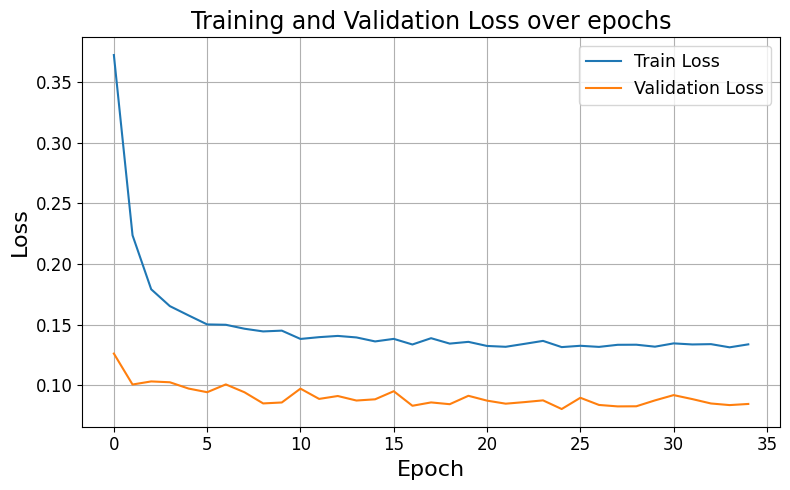

In [ ]:
# Extract losses
train_losses = final_history['train_loss']
val_losses = final_history['val_loss']
actual_epochs = final_history['actual_epochs']

# Plot
plt.figure(figsize=(8, 5))
plt.plot(range(actual_epochs), train_losses, label='Train Loss')
plt.plot(range(actual_epochs), val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss over epochs')
plt.legend()
plt.grid(True)
plt.tight_layout()

filename = os.path.join("4_plots", sel_zone, energies[target_index], "Train_vs_Val_loss.png")
plt.savefig(filename)
plt.show()

In [ ]:
final_model.eval()  # Keep dropout active during MC sampling

num_passes = 100
mean_preds = None

for i in range(num_passes):
    preds = final_model(X_test_tensor.to(device)).cpu()

    if mean_preds is None:
        mean_preds = preds.clone()
    else:
        delta = preds - mean_preds
        mean_preds += delta / (i + 1)

mean_test_predictions = mean_preds.detach().numpy()

print((mean_test_predictions).shape)

(1194, 1)


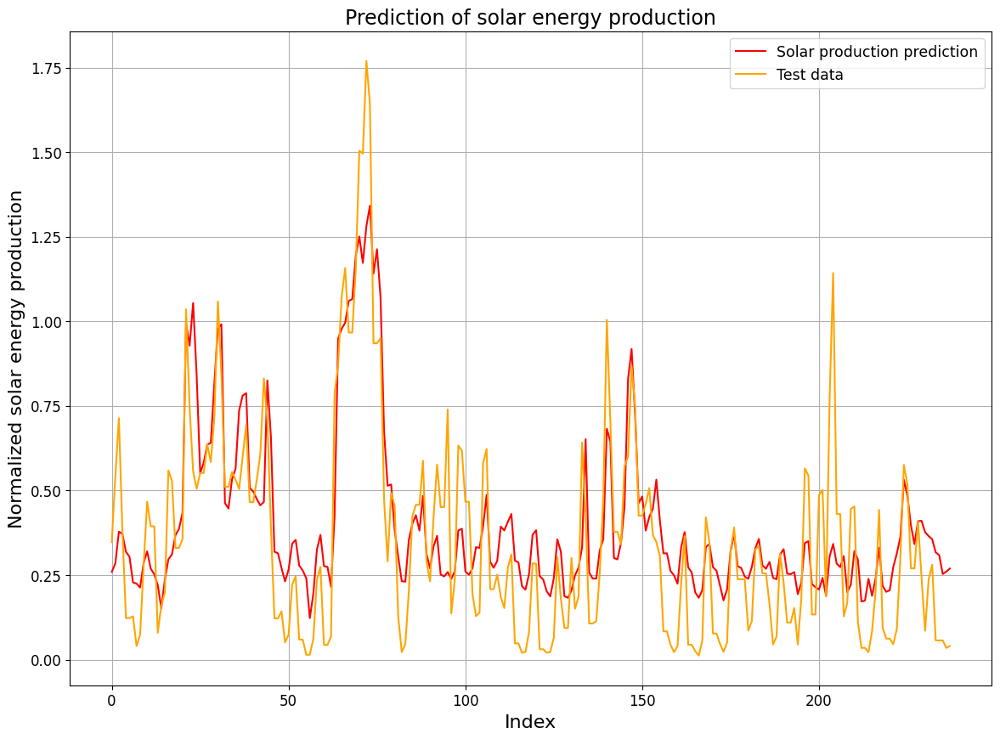

In [ ]:
# regression test prediction vs test data

plt.rcParams.update({
    'axes.titlesize': 17,
    'axes.labelsize': 16,
    'xtick.labelsize': 12,
    'ytick.labelsize': 12,
    'legend.fontsize': 12.5
})

Y_test = Y_test_tensor.numpy()

mean_test_predictions = mean_test_predictions.reshape(-1, 1)
Y_test = Y_test.reshape(-1, 1)

plt.figure(figsize=(14, 10))

subset_len = int(len(mean_test_predictions) / 5)

plt.plot(np.arange(subset_len),
         mean_test_predictions[:subset_len, 0],
         color='red', label=f'{energies[target_index]} production prediction')

plt.plot(np.arange(subset_len),
         Y_test[:subset_len, 0],
         color='orange', label='Test data')

plt.xlabel("Index")
plt.ylabel(f"Normalized {energies[target_index]} energy production")
plt.title(f"Prediction of {energies[target_index]} energy production")
plt.grid(True)
plt.legend()
filename = os.path.join("4_plots", sel_zone, energies[target_index], "Prediction.png")
plt.savefig(filename)
plt.show()

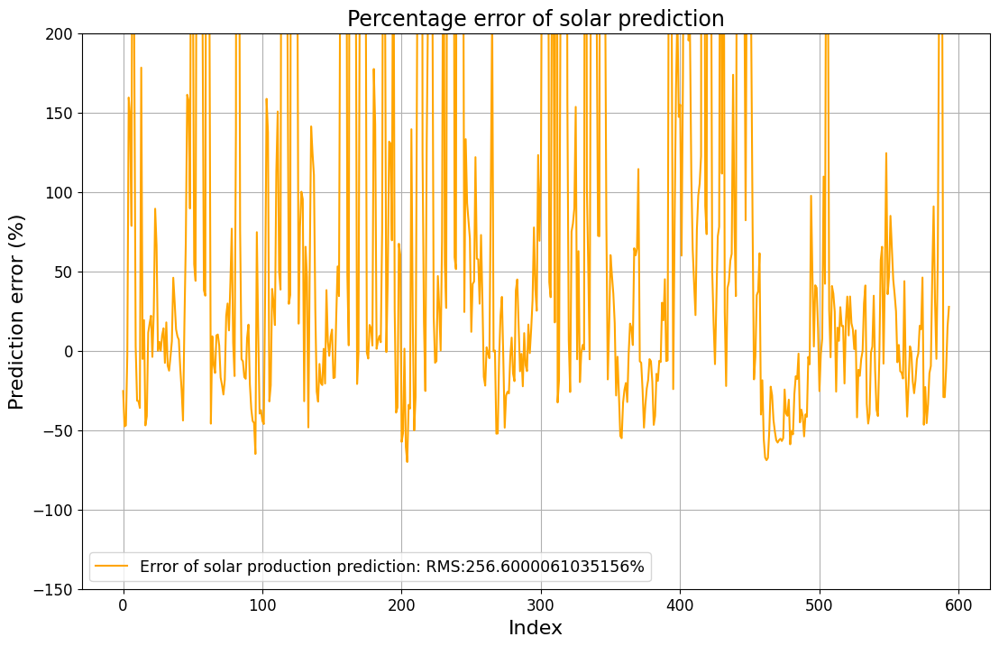

In [ ]:
plt.figure(figsize=(13, 8))

Y_test_pos = Y_test[Y_test>=0.01]
error_solar= (mean_test_predictions[Y_test >= 0.01][:int(len(Y_test_pos)/2)]- Y_test_pos[:int(len(Y_test_pos)/2)]) / Y_test_pos[:int(len(Y_test_pos)/2)]
plt.plot(np.arange(int(len(Y_test_pos)/2)), (error_solar*100), color='orange', label=f'Error of {energies[target_index]} production prediction: RMS:{round(np.sqrt(np.mean((error_solar*100)**2)),1)}%')
plt.xlabel("Index")
plt.ylabel("Prediction error (%)")
plt.title(f"Percentage error of {energies[target_index]} prediction")
plt.grid(True)
plt.ylim(-150,200)
plt.legend()
filename = os.path.join("4_plots", sel_zone, energies[target_index], "Error.png")
plt.savefig(filename)
plt.show()

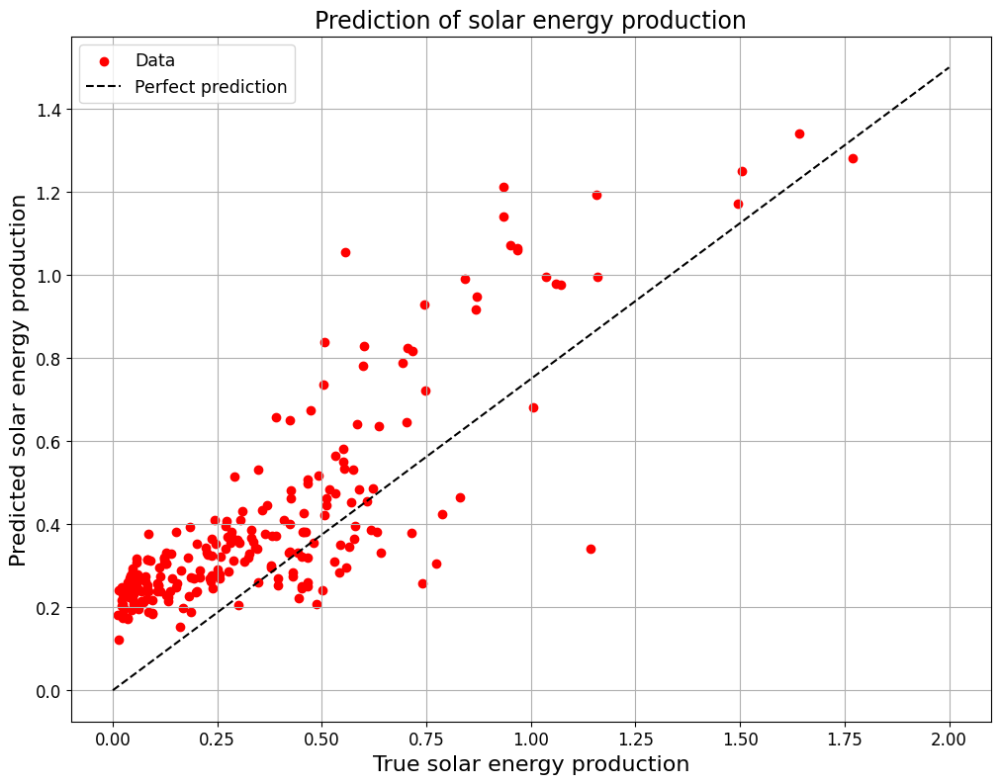

In [ ]:
plt.figure(figsize=(12, 9))
plt.scatter(Y_test[:int(len(Y_test)/5)],mean_test_predictions[:int(len(mean_test_predictions)/5)],color='red',label='Data')
plt.xlabel("True solar energy production")
plt.plot(np.array(np.linspace(0,2,1000)),np.array(np.linspace(0,1.5,1000)),label='Perfect prediction',color='black',linestyle='--')
plt.ylabel(f"Predicted {energies[target_index]} energy production")
plt.title(f"Prediction of {energies[target_index]} energy production")
plt.grid(True)
plt.legend()
filename = os.path.join("4_plots", sel_zone, energies[target_index], "Prediction_scatter.png")
plt.savefig(filename)
plt.show()